In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder, StandardScaler
from fuzzywuzzy import process
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import validation_curve
import statsmodels.api as sm


# Load the dataset
data = pd.read_csv('Energy_Consumption_Data.csv')

# print first few rows
data.head()

,House_ID,Month,Area_sq_ft,Occupants,Heating_Type,Age_of_Building,Insulation_Quality,Daily_Average_Consumption_kWh,Season,Energy_Efficiency_Rating,Tariff_Type,Bill_Amount,Renewable_Energy_Installed,Temperature_Average,Power_Outages,Monthly_Consumption_kWh
0,7271,Jan,662.0,5,NaN,27,Good,14.335539,Spring,2,Time-of-Use,88.741986,Yes,55.467771,1,501.232780
1,861,Oct,1253.0,2,NaN,13,cverage,25.917839,Spring,3,Variable,92.354940,Yes,36.388473,1,742.352878
2,5391,Dec,NaN,3,Gas,22,Poor,33.127843,Summer,6,Fixed,96.708638,No,94.550243,0,1018.708608
3,5192,Aug,1535.0,1,NaN,16,Good,7.451494,Autumn,6,Variable,95.568663,No,62.862087,2,199.420939
4,5735,Sep,1336.0,5,NaN,13,Excellent,34.649571,Winter,10,Variable,NaN,No,93.559405,3,933.151370


In [2]:
# Check for missing values
missing_values = data.isnull().sum()
missing_percentage = (missing_values / len(data)) * 100
missing_data = pd.DataFrame({'Missing Values': missing_values, 'Percentage': missing_percentage})
print(missing_data)

                               Missing Values  Percentage
House_ID                                    0       0.000
Month                                       6       0.006
Area_sq_ft                               5000       5.000
Occupants                                   0       0.000
Heating_Type                            35263      35.263
Age_of_Building                             0       0.000
Insulation_Quality                          0       0.000
Daily_Average_Consumption_kWh               0       0.000
Season                                      0       0.000
Energy_Efficiency_Rating                    0       0.000
Tariff_Type                                 0       0.000
Bill_Amount                              5000       5.000
Renewable_Energy_Installed                  0       0.000
Temperature_Average                      5000       5.000
Power_Outages                               0       0.000
Monthly_Consumption_kWh                     0       0.000


In [3]:
# Check for duplicate House_ID values
duplicate_house_ids = data['House_ID'].value_counts()

# Filter and print only duplicate House_IDs
duplicate_house_ids = duplicate_house_ids[duplicate_house_ids > 1]

print(f"Number of duplicate House_IDs: {duplicate_house_ids.count()}")
print("Duplicate House_IDs and their counts:")
print(duplicate_house_ids)

Number of duplicate House_IDs: 8333
Duplicate House_IDs and their counts:
House_ID
8096    27
2926    25
2429    24
6027    24
5244    24
        ..
275      3
7439     3
7325     2
4163     2
1431     2
Name: count, Length: 8333, dtype: int64


In [4]:
# Drop the House_ID column since there is a large number of duplicates, causing the ID assigned to be useless.
data = data.drop(columns=['House_ID'])

# Save the cleaned dataset without House_ID
data.to_csv('Cleaned_Energy_Consumption_Data.csv', index=False)

In [5]:
# Verify the saved file
saved_data = pd.read_csv('Cleaned_Energy_Consumption_Data.csv')
print(saved_data.head())

  Month  Area_sq_ft Occupants Heating_Type  Age_of_Building  \
0   Jan       662.0         5          NaN               27   
1   Oct      1253.0         2          NaN               13   
2   Dec         NaN         3          Gas               22   
3   Aug      1535.0         1          NaN               16   
4   Sep      1336.0         5          NaN               13   

  Insulation_Quality  Daily_Average_Consumption_kWh  Season  \
0               Good                      14.335539  Spring   
1            cverage                      25.917839  Spring   
2               Poor                      33.127843  Summer   
3               Good                       7.451494  Autumn   
4          Excellent                      34.649571  Winter   

   Energy_Efficiency_Rating  Tariff_Type  Bill_Amount  \
0                         2  Time-of-Use    88.741986   
1                         3     Variable    92.354940   
2                         6        Fixed    96.708638   
3             

In [6]:
#onto other features

In [7]:
# Checking for any missing values in Heating_Type
print(data['Heating_Type'].isnull().sum())


35263


In [8]:
# Check column counts
heating_type_counts = data['Heating_Type'].value_counts()
print(data['Heating_Type'].unique())
print(heating_type_counts)

# Check for missing values in Heating_Type
print(data['Heating_Type'].isnull().sum())

[nan 'Gas' 'Electric' 'Electxic' 'plectric' 'Gaz' 'Noxe' 'was' 'Eeectric'
 'Elertric' 'Noni' 'Nonz' 'Nonk' 'Elejtric' 'Ngne' 'Ekectric' 'Ezectric'
 'ras' 'Gws' 'Nine' 'Electrkc' 'Eluctric' 'Electris' 'Nonu' 'Nfne'
 'Electfic' 'jone' 'Gds' 'Gak' 'Nxne' 'Nbne' 'bas' 'Eleczric' 'Elecgric'
 'Electrig' 'ylectric' 'Eledtric' 'Electuic' 'Nonj' 'Nonr' 'Gae' 'Gag'
 'Gjs' 'none' 'Electrcc' 'ulectric' 'zas' 'Gay' 'Nyne' 'Elecdric'
 'Eldctric' 'Esectric' 'Gan' 'Ndne' 'Elrctric' 'Noce' 'has' 'Eleceric'
 'Nsne' 'Elehtric' 'vlectric' 'xas' 'eas' 'qas' 'qlectric' 'kas'
 'Electrbc' 'Elecsric' 'Nonc' 'Nope' 'Electrid' 'Nonn' 'Elmctric' 'Nzne'
 'Gad' 'Noge' 'Ghs' 'Ejectric' 'Gax' 'Nore' 'fone' 'Gcs' 'Nose' 'wlectric'
 'Gat' 'Nony' 'Eleclric' 'Nonp' 'Electrzc' 'Eleptric' 'Gai' 'Eljctric'
 'Eleetric' 'Electriw' 'Gal' 'fas' 'Electrxc' 'Ewectric' 'Ges' 'Gab' 'mas'
 'Nonm' 'Gah' 'cone' 'Noze' 'Elhctric' 'tone' 'Node' 'Noke' 'Gis'
 'Electrix' 'Electnic' 'Nqne' 'gas' 'qone' 'Nooe' 'llectric' 'Gls'
 'Elpctric' '

In [9]:
data['Heating_Type'].fillna('Temp', inplace=True)

In [10]:
# Define correct categories
correct_heating_types = ['Temp', 'None', 'Gas', 'Electric']

# Function to correct typos using fuzzy matching
def correct_typos(value, categories):
    best_match = process.extractOne(value, categories)
    return best_match[0] if best_match[1] >= 60 else value

data['Heating_Type'] = data['Heating_Type'].apply(lambda x: correct_typos(x, correct_heating_types))


# Verify the unique values after correction
print(data['Heating_Type'].unique())

['Temp' 'Gas' 'Electric' 'None']


In [11]:
# Count the number of each unique value in the Heating Type column
heating_type_counts = data['Heating_Type'].value_counts()

# Display the total count
print(heating_type_counts)

Heating_Type
Temp        35263
Electric    31609
Gas         31597
None         1531
Name: count, dtype: int64


In [12]:
# Save the cleaned data to a new CSV file
data.to_csv('Cleaned_Energy_Consumption_Data.csv', index=False)

# Verify the saved file
saved_data = pd.read_csv('Cleaned_Energy_Consumption_Data.csv')


In [13]:
# Load the dataset
data = pd.read_csv('Cleaned_Energy_Consumption_Data.csv')

# Ensure all values in the Heating_Type column are treated as strings
data['Heating_Type'] = data['Heating_Type'].astype(str)


# Drop rows where Heating_Type is 'Temp', 
data = data[data['Heating_Type'] != 'Temp']

data['Heating_Type'] = data['Heating_Type'].replace('nan', 'None')

# Save the cleaned data to a new CSV file
data.to_csv('Cleaned_Energy_Consumption_Data.csv', index=False)

# Verify the changes
heating_type_counts = data['Heating_Type'].value_counts()
print(data['Heating_Type'].unique())
print(heating_type_counts)

['Gas' 'Electric' 'None']
Heating_Type
Electric    31609
Gas         31597
None         1531
Name: count, dtype: int64


In [14]:
print(saved_data[['Monthly_Consumption_kWh']].head())

   Monthly_Consumption_kWh
0               501.232780
1               742.352878
2              1018.708608
3               199.420939
4               933.151370


In [15]:
# Check for missing values
missing_values = data.isnull().sum()
missing_percentage = (missing_values / len(data)) * 100
missing_data = pd.DataFrame({'Missing Values': missing_values, 'Percentage': missing_percentage})
print(missing_data)

                               Missing Values  Percentage
Month                                       3    0.004634
Area_sq_ft                               3235    4.997142
Occupants                                   0    0.000000
Heating_Type                                0    0.000000
Age_of_Building                             0    0.000000
Insulation_Quality                          0    0.000000
Daily_Average_Consumption_kWh               0    0.000000
Season                                      0    0.000000
Energy_Efficiency_Rating                    0    0.000000
Tariff_Type                                 0    0.000000
Bill_Amount                              3219    4.972427
Renewable_Energy_Installed                  0    0.000000
Temperature_Average                      3281    5.068199
Power_Outages                               0    0.000000
Monthly_Consumption_kWh                     0    0.000000


In [16]:
# Drop rows with missing Month values, only 3 
data.dropna(subset=['Month'], inplace=True)

In [17]:
#Impute missing values for 'Area_sq_ft', 'Bill_Amount', and 'Temperature_Average' with the median.
#If the missing values matched up on the row I would drop the entire row however it is miss-matched so better to impute.
data['Area_sq_ft'].fillna(data['Area_sq_ft'].median(), inplace=True)
data['Bill_Amount'].fillna(data['Bill_Amount'].median(), inplace=True)
data['Temperature_Average'].fillna(data['Temperature_Average'].median(), inplace=True)

In [18]:
# Verify that there are no missing values left
missing_values = data.isnull().sum()
missing_percentage = (missing_values / len(data)) * 100
missing_data = pd.DataFrame({'Missing Values': missing_values, 'Percentage': missing_percentage})
print(missing_data)

                               Missing Values  Percentage
Month                                       0         0.0
Area_sq_ft                                  0         0.0
Occupants                                   0         0.0
Heating_Type                                0         0.0
Age_of_Building                             0         0.0
Insulation_Quality                          0         0.0
Daily_Average_Consumption_kWh               0         0.0
Season                                      0         0.0
Energy_Efficiency_Rating                    0         0.0
Tariff_Type                                 0         0.0
Bill_Amount                                 0         0.0
Renewable_Energy_Installed                  0         0.0
Temperature_Average                         0         0.0
Power_Outages                               0         0.0
Monthly_Consumption_kWh                     0         0.0


In [19]:
# Define the correct categories for Insulation_Quality
correct_categories = ['Poor', 'Average', 'Good', 'Excellent']

# Function to correct typos using fuzzy matching
def correct_typos(value, categories):
    best_match = process.extractOne(value, categories)
    return best_match[0] if best_match[1] >= 70 else value

# Apply the function to the Insulation_Quality column
data['Insulation_Quality'] = data['Insulation_Quality'].apply(lambda x: correct_typos(x, correct_categories))

In [20]:
# Verify the unique values after correction
print(data['Insulation_Quality'].unique())

['Poor' 'Excellent' 'Good' 'Average']


In [21]:
# Define the categories
correct_tariffs = ['Fixed', 'Variable', 'Time-of-Use']

# Function to correct typos using fuzzy matching
def correct_typos(value, categories):
    best_match = process.extractOne(value, categories)
    return best_match[0] if best_match[1] >= 70 else value

# Apply the function to the Tariff_Type column
data['Tariff_Type'] = data['Tariff_Type'].apply(lambda x: correct_typos(x, correct_tariffs))

# Verify the unique values after correction
print(data['Tariff_Type'].unique())

['Fixed' 'Time-of-Use' 'Variable']


In [22]:
# Define the correct month names
correct_month_names = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

# Function to correct typos using fuzzy matching
def correct_month_typo(value, correct_names):
    best_match = process.extractOne(value, correct_names)
    return best_match[0] if best_match[1] >= 50 else 'Unknown'

# Apply the function to the Month column
data['Month'] = data['Month'].apply(lambda x: correct_month_typo(x, correct_month_names))

# Verify the unique values after correction
print(data['Month'].unique())

['Dec' 'Jan' 'Mar' 'May' 'Oct' 'Jun' 'Apr' 'Sep' 'Aug' 'Nov' 'Feb' 'Jul']


In [23]:
# Count the occurrences of each unique value in the Heating_Type column
Month_type_counts = data['Month'].value_counts()

# Display the counts
print(Month_type_counts)

Month
Jan    5556
Dec    5489
Mar    5480
Feb    5456
Jun    5437
Oct    5422
Sep    5405
Nov    5347
Jul    5347
May    5312
Aug    5245
Apr    5238
Name: count, dtype: int64


In [24]:
# Save the cleaned data to a new CSV file
data.to_csv('Cleaned_Energy_Consumption_Data.csv', index=False)

# Verify the saved file
saved_data = pd.read_csv('Cleaned_Energy_Consumption_Data.csv')
print(saved_data.head())

  Month  Area_sq_ft Occupants Heating_Type  Age_of_Building  \
0   Dec      1496.0         3          Gas               22   
1   Jan      1588.0         4          Gas                0   
2   Mar      1357.0         3          Gas               36   
3   May      1704.0         1     Electric               33   
4   Oct      1423.0         3     Electric               23   

  Insulation_Quality  Daily_Average_Consumption_kWh  Season  \
0               Poor                      33.127843  Summer   
1          Excellent                      27.948196  Summer   
2               Poor                      20.500371  Summer   
3               Good                      16.819534  Autumn   
4               Good                      37.373429  Winter   

   Energy_Efficiency_Rating  Tariff_Type  Bill_Amount  \
0                         6        Fixed    96.708638   
1                         1        Fixed   106.584643   
2                         5  Time-of-Use    89.222194   
3             

In [25]:
#onto some numerical outliers etc

In [26]:
# Check all the different values of Occupants
print(data['Occupants'].unique())

['3' '4' '1' '2' '5' 'five' 'fiwe' 'fave' 'fiva' 'fivg' 'sive' 'fwve'
 'fiae' 'live' 'fsve' 'fize' 'fivc' 'flve' 'oive' 'iive' 'kive' 'qive'
 'fihe' 'hive' 'fivn' 'fivl' 'fife' 'fiee' 'fqve' 'fbve' 'fije' 'fivd'
 'fiie' 'fioe' 'tive' 'cive' 'fdve' 'ffve' 'nive' 'fire' 'fgve' 'fivm'
 'fpve' 'fxve' 'yive' 'ftve' 'fivq' 'rive' 'fivr']


In [27]:
# Define a mapping for common string representations of numbers, to fix the occupants column
num_mapping = {
    'zero': 0, 'one': 1, 'two': 2, 'three': 3, 'four': 4, 'five': 5,
    'six': 6, 'seven': 7, 'eight': 8, 'nine': 9, 'ten': 10
}

# Convert non-numeric values using the mapping
data['Occupants'] = data['Occupants'].apply(lambda x: num_mapping.get(x.lower(), x) if isinstance(x, str) else x)

# Convert to numeric
data['Occupants'] = pd.to_numeric(data['Occupants'], errors='coerce')

# Verify the conversion
print(data['Occupants'].dtype)
print(data['Occupants'].unique())

float64
[ 3.  4.  1.  2.  5. nan]


In [28]:
# Impute any nulls with the median
data['Occupants'].fillna(data['Occupants'].median(), inplace=True)

# Verify the changes
print(data['Occupants'].isnull().sum())
print(data['Occupants'].describe())

0
count    64734.000000
mean         3.046204
std          1.423038
min          1.000000
25%          2.000000
50%          3.000000
75%          4.000000
max          5.000000
Name: Occupants, dtype: float64


In [29]:
print(data['Occupants'].unique())

[3. 4. 1. 2. 5.]


In [30]:
# Convert negative values to positive in Age_of_Building column
data['Age_of_Building'] = data['Age_of_Building'].abs()

# Verify the conversion
print(data['Age_of_Building'].describe())
print(data['Age_of_Building'].unique())

count    64734.000000
mean        19.657460
std          9.675145
min          0.000000
25%         13.000000
50%         20.000000
75%         26.000000
max         66.000000
Name: Age_of_Building, dtype: float64
[22  0 36 33 23 26 15  9  8 46 18  5 40  1 14 21 24 32 29 12 13 20 30 16
 19  7 45 43 42 10 34 11 28 27  6  2 35  4 37 25 38 31 17  3 39 56 47 41
 48 44 52 49 50 54 55 51 53 57 59 66]


In [31]:
# Save the cleaned data to a new CSV file
data.to_csv('Cleaned_Energy_Consumption_Data.csv', index=False)

# Verify the saved file
saved_data = pd.read_csv('Cleaned_Energy_Consumption_Data.csv')
print(saved_data.head())

  Month  Area_sq_ft  Occupants Heating_Type  Age_of_Building  \
0   Dec      1496.0        3.0          Gas               22   
1   Jan      1588.0        4.0          Gas                0   
2   Mar      1357.0        3.0          Gas               36   
3   May      1704.0        1.0     Electric               33   
4   Oct      1423.0        3.0     Electric               23   

  Insulation_Quality  Daily_Average_Consumption_kWh  Season  \
0               Poor                      33.127843  Summer   
1          Excellent                      27.948196  Summer   
2               Poor                      20.500371  Summer   
3               Good                      16.819534  Autumn   
4               Good                      37.373429  Winter   

   Energy_Efficiency_Rating  Tariff_Type  Bill_Amount  \
0                         6        Fixed    96.708638   
1                         1        Fixed   106.584643   
2                         5  Time-of-Use    89.222194   
3       

In [32]:
# Check for the presence of the 'Age_of_Building' column
print("Columns in DataFrame:")
print(data.columns)


Columns in DataFrame:
Index(['Month', 'Area_sq_ft', 'Occupants', 'Heating_Type', 'Age_of_Building',
       'Insulation_Quality', 'Daily_Average_Consumption_kWh', 'Season',
       'Energy_Efficiency_Rating', 'Tariff_Type', 'Bill_Amount',
       'Renewable_Energy_Installed', 'Temperature_Average', 'Power_Outages',
       'Monthly_Consumption_kWh'],
      dtype='object')


In [33]:
# Verify the content of the 'Age_of_Building' column
print("First few rows of 'Age_of_Building' column:")
print(data['Age_of_Building'].head())


First few rows of 'Age_of_Building' column:
2     22
5      0
6     36
9     33
11    23
Name: Age_of_Building, dtype: int64


In [34]:
# Verify if there are any missing values in 'Age_of_Building'
print("Missing values in 'Age_of_Building':", data['Age_of_Building'].isnull().sum())


Missing values in 'Age_of_Building': 0


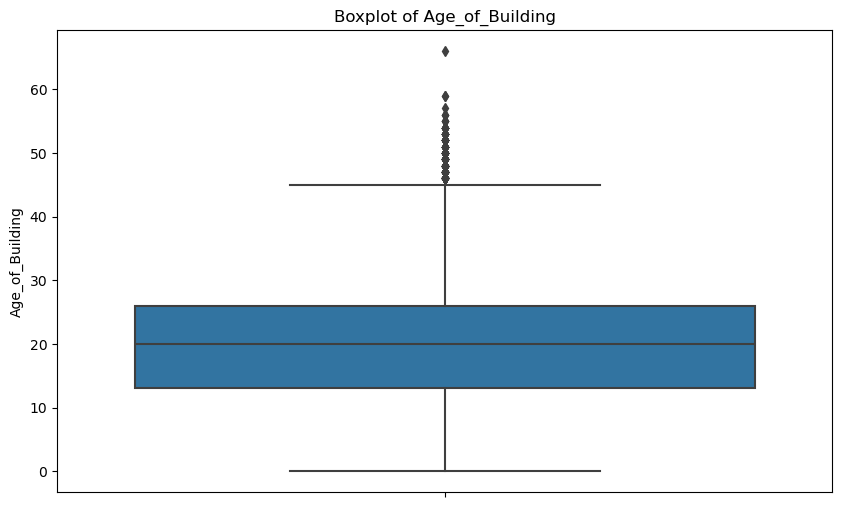

In [35]:
# Visualize outliers using a boxplot
plt.figure(figsize=(10, 6))
sns.boxplot(data=data, y='Age_of_Building')
plt.title('Boxplot of Age_of_Building')
plt.show()

In [36]:
#leaving outliers as they could be practical, such as hisotiral buildings etc.

In [37]:
# Check for missing values
print(data['Area_sq_ft'].isnull().sum())

0


In [38]:
# Check the data type
print(data['Area_sq_ft'].dtype)


float64


In [39]:
# Convert to numeric if necessary
data['Area_sq_ft'] = pd.to_numeric(data['Area_sq_ft'], errors='coerce')

# Verify the conversion
print(data['Area_sq_ft'].dtype)

float64


In [40]:
# Save the cleaned data to a new CSV file
data.to_csv('Cleaned_Energy_Consumption_Data.csv', index=False)

# Verify the saved file
saved_data = pd.read_csv('Cleaned_Energy_Consumption_Data.csv')
print(saved_data[['Area_sq_ft']].head())

   Area_sq_ft
0      1496.0
1      1588.0
2      1357.0
3      1704.0
4      1423.0


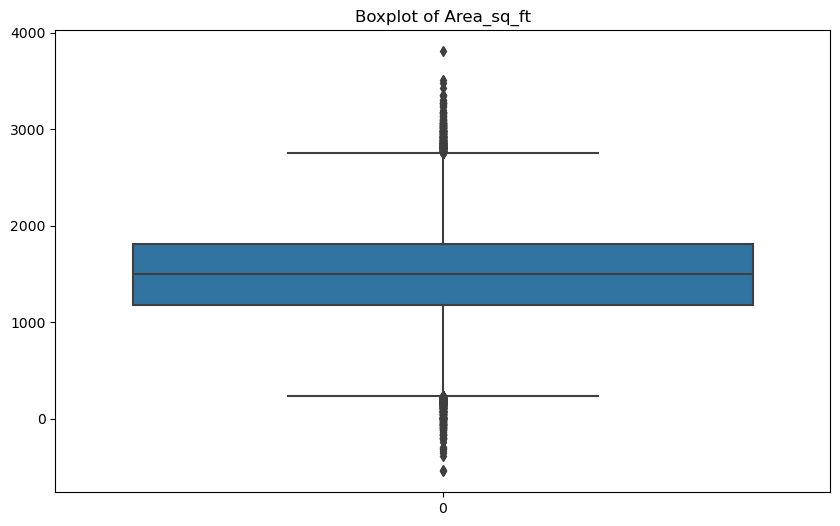

In [41]:
# Load the dataset
data = pd.read_csv('Cleaned_Energy_Consumption_Data.csv')

# Visualize outliers using a boxplot
plt.figure(figsize=(10, 6))
sns.boxplot(data['Area_sq_ft'])
plt.title('Boxplot of Area_sq_ft')
plt.show()


In [42]:
#cap outliers to each quantile
def cap_outliers(data, column):
    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    data[column] = np.where(data[column] < lower_bound, lower_bound, data[column])
    data[column] = np.where(data[column] > upper_bound, upper_bound, data[column])

# Cap outliers 
cap_outliers(data, 'Area_sq_ft')

# Verify the changes
print(data['Area_sq_ft'].describe())


count    64734.000000
mean      1495.562193
std        479.932626
min        232.500000
25%       1179.000000
50%       1496.000000
75%       1810.000000
max       2756.500000
Name: Area_sq_ft, dtype: float64


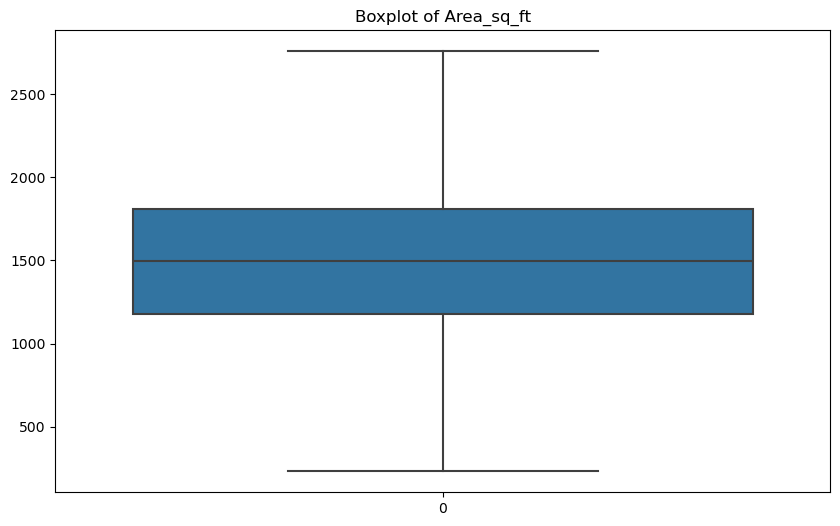

In [43]:
# Visualize data with a boxplot to confirm no outliers
plt.figure(figsize=(10, 6))
sns.boxplot(data['Area_sq_ft'])
plt.title('Boxplot of Area_sq_ft')
plt.show()

In [44]:
# Check unique values in seasons column
print(data['Season'].unique())

['Summer' 'Autumn' 'Winter' 'Spring']


In [45]:
# Check for missing values in Daily_Average_Consumption_kWh
print(data['Daily_Average_Consumption_kWh'].isnull().sum())

0


In [46]:
# Check the data type of Daily_Average_Consumption_kWh
print(data['Daily_Average_Consumption_kWh'].dtype)


float64


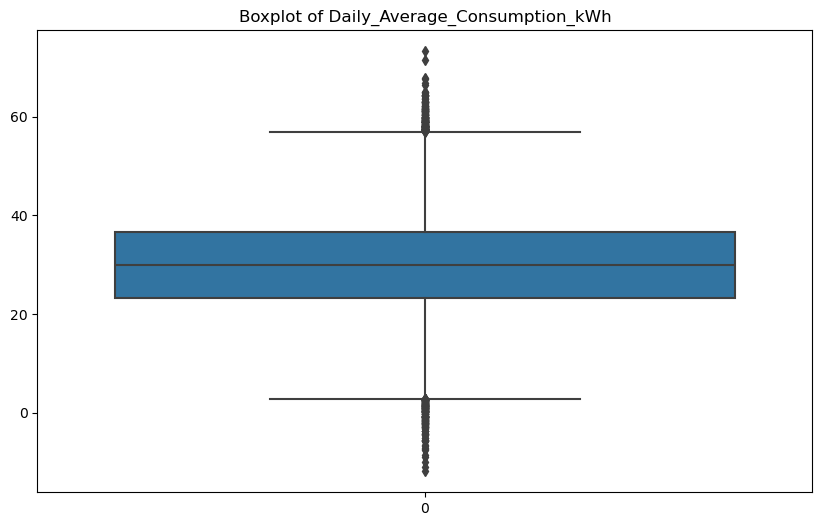

In [47]:
# Visualize outliers using a boxplot
plt.figure(figsize=(10, 6))
sns.boxplot(data['Daily_Average_Consumption_kWh'])
plt.title('Boxplot of Daily_Average_Consumption_kWh')
plt.show()

In [48]:
#cap outliers for daily average
def cap_outliers(data, column):
    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    data[column] = np.where(data[column] < lower_bound, lower_bound, data[column])
    data[column] = np.where(data[column] > upper_bound, upper_bound, data[column])

#cap outliers for daily average
cap_outliers(data, 'Daily_Average_Consumption_kWh')

# Verify the changes
print(data['Daily_Average_Consumption_kWh'].describe())

count    64734.000000
mean        29.965077
std          9.907358
min          2.868197
25%         23.174724
50%         29.951454
75%         36.712408
max         57.018935
Name: Daily_Average_Consumption_kWh, dtype: float64


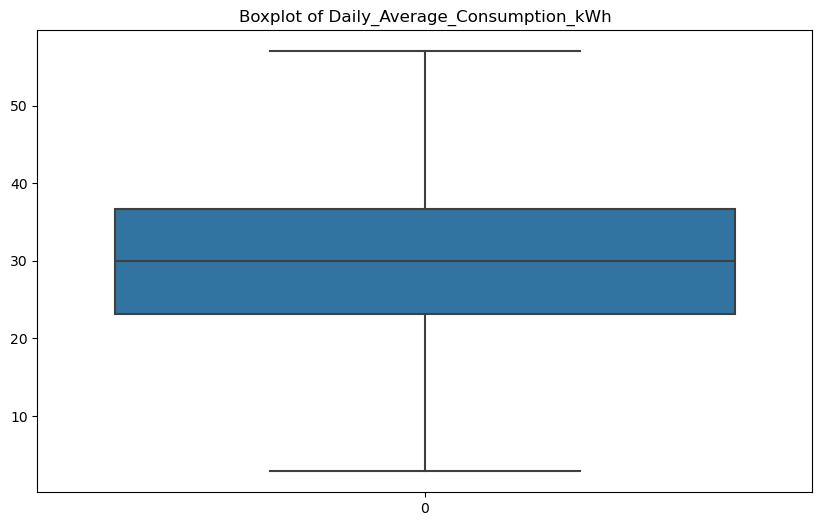

In [49]:
# Visualize boxplot after capping outliers
plt.figure(figsize=(10, 6))
sns.boxplot(data['Daily_Average_Consumption_kWh'])
plt.title('Boxplot of Daily_Average_Consumption_kWh')
plt.show()

In [50]:
# Save
data.to_csv('Cleaned_Energy_Consumption_Data.csv', index=False)

# Verify the saved file
saved_data = pd.read_csv('Cleaned_Energy_Consumption_Data.csv')
print(saved_data[['Daily_Average_Consumption_kWh']].head())

   Daily_Average_Consumption_kWh
0                      33.127843
1                      27.948196
2                      20.500371
3                      16.819534
4                      37.373429


In [51]:
# Check the data type of Energy_Efficiency_Rating
print(data['Energy_Efficiency_Rating'].dtype)

# Convert to numeric if necessary
data['Energy_Efficiency_Rating'] = pd.to_numeric(data['Energy_Efficiency_Rating'], errors='coerce')

# Verify the conversion
print(data['Energy_Efficiency_Rating'].dtype)

int64
int64


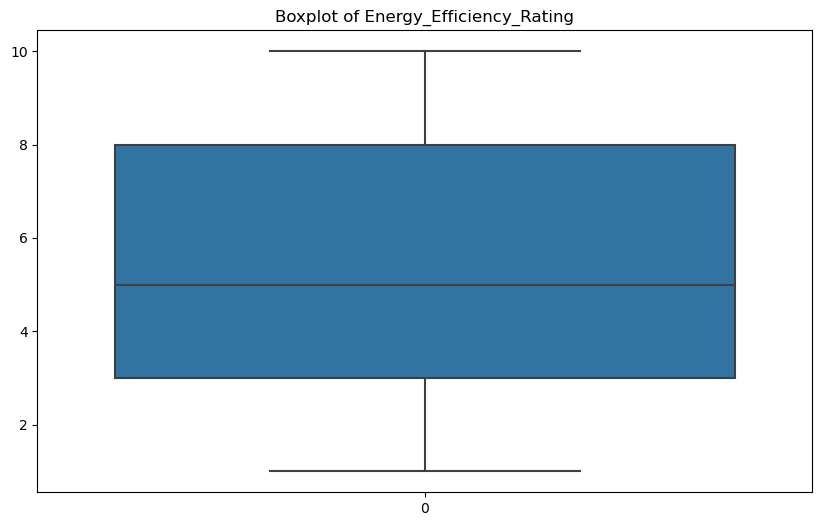

In [52]:
# Visualize outliers using a boxplot
plt.figure(figsize=(10, 6))
sns.boxplot(data['Energy_Efficiency_Rating'])
plt.title('Boxplot of Energy_Efficiency_Rating')
plt.show()

In [53]:
# Verify unique values in Renewable_Energy_Installed
print(data['Renewable_Energy_Installed'].unique())


['No' 'Yes']


In [54]:
# Check for missing values in Power_Outages
print(data['Power_Outages'].isnull().sum())

0


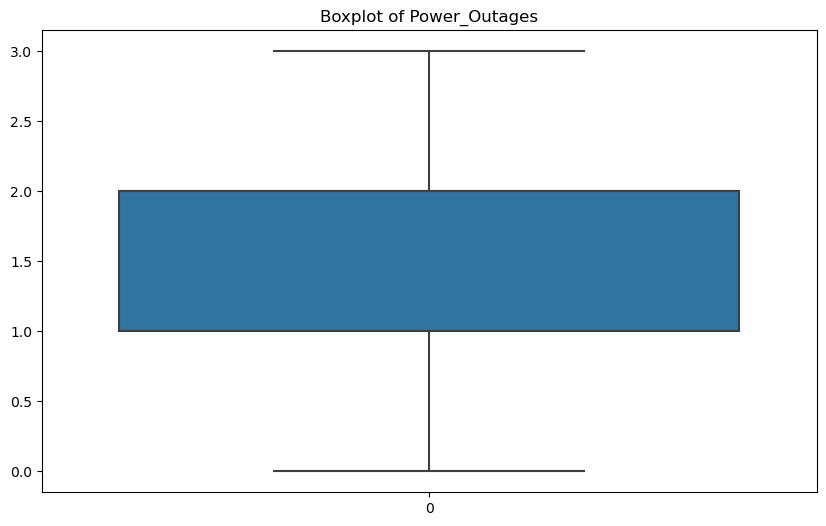

In [55]:
# Visualize boxplot
plt.figure(figsize=(10, 6))
sns.boxplot(data['Power_Outages'])
plt.title('Boxplot of Power_Outages')
plt.show()

In [56]:
# Check for missing values in Tariff_Type
print(data['Tariff_Type'].isnull().sum())


0


In [57]:
# Check for missing values in Monthly_Consumption_kWh
print(data['Monthly_Consumption_kWh'].isnull().sum())


0


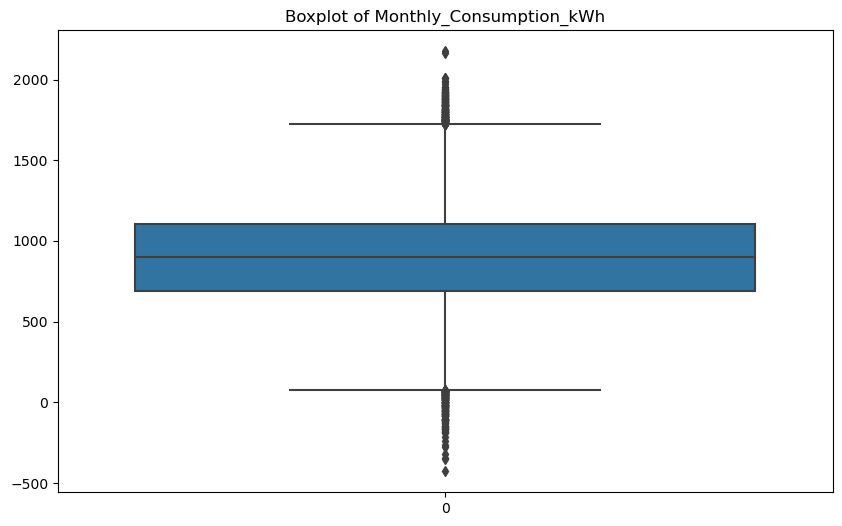

In [58]:
# Visualize monthly usage boxplot
plt.figure(figsize=(10, 6))
sns.boxplot(data['Monthly_Consumption_kWh'])
plt.title('Boxplot of Monthly_Consumption_kWh')
plt.show()


In [59]:
#cap outliers
def cap_outliers(data, column):
    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    data[column] = np.where(data[column] < lower_bound, lower_bound, data[column])
    data[column] = np.where(data[column] > upper_bound, upper_bound, data[column])

# Cap outliers in Monthly_Consumption_kWh
cap_outliers(data, 'Monthly_Consumption_kWh')

# Verify the changes
print(data['Monthly_Consumption_kWh'].describe())

# Save the cleaned data to a new CSV file
data.to_csv('Cleaned_Energy_Consumption_Data.csv', index=False)

# Verify the saved file
saved_data = pd.read_csv('Cleaned_Energy_Consumption_Data.csv')
print(saved_data[['Monthly_Consumption_kWh']].head())

count    64734.000000
mean       898.832387
std        301.790616
min         74.263899
25%        692.135314
50%        899.314811
75%       1104.049591
max       1721.921006
Name: Monthly_Consumption_kWh, dtype: float64
   Monthly_Consumption_kWh
0              1018.708608
1               841.695260
2               589.555391
3               542.070115
4              1100.652205


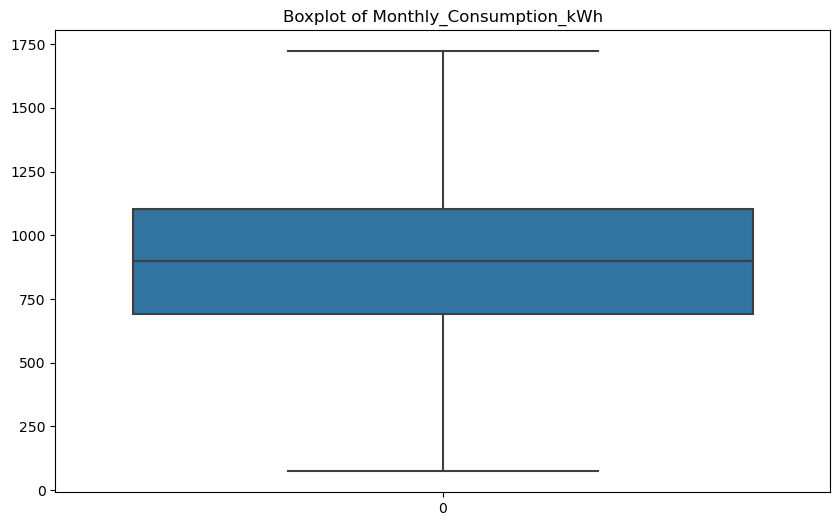

In [60]:
# Visualize outliers using a boxplot after capping
plt.figure(figsize=(10, 6))
sns.boxplot(data['Monthly_Consumption_kWh'])
plt.title('Boxplot of Monthly_Consumption_kWh')
plt.show()

In [61]:
# Verify the changes
print(data['Monthly_Consumption_kWh'].describe())

# Save the cleaned data to a new CSV file
data.to_csv('Cleaned_Energy_Consumption_Data.csv', index=False)

# Verify the saved file
saved_data = pd.read_csv('Cleaned_Energy_Consumption_Data.csv')
print(saved_data[['Monthly_Consumption_kWh']].head())

count    64734.000000
mean       898.832387
std        301.790616
min         74.263899
25%        692.135314
50%        899.314811
75%       1104.049591
max       1721.921006
Name: Monthly_Consumption_kWh, dtype: float64
   Monthly_Consumption_kWh
0              1018.708608
1               841.695260
2               589.555391
3               542.070115
4              1100.652205


In [62]:
# Check for missing values
missing_values = data.isnull().sum()
missing_percentage = (missing_values / len(data)) * 100
missing_data = pd.DataFrame({'Missing Values': missing_values, 'Percentage': missing_percentage})
print(missing_data)

                               Missing Values  Percentage
Month                                       0    0.000000
Area_sq_ft                                  0    0.000000
Occupants                                   0    0.000000
Heating_Type                             1531    2.365063
Age_of_Building                             0    0.000000
Insulation_Quality                          0    0.000000
Daily_Average_Consumption_kWh               0    0.000000
Season                                      0    0.000000
Energy_Efficiency_Rating                    0    0.000000
Tariff_Type                                 0    0.000000
Bill_Amount                                 0    0.000000
Renewable_Energy_Installed                  0    0.000000
Temperature_Average                         0    0.000000
Power_Outages                               0    0.000000
Monthly_Consumption_kWh                     0    0.000000


In [63]:
# Load the dataset
data = pd.read_csv('cleaned_Energy_Consumption_Data.csv')

# Convert any null values in 'Heating_Type' column to 'None', for some reason this was undone from before. no issue though
data['Heating_Type'].fillna('None', inplace=True)

# Verify the changes
print(data['Heating_Type'].isnull().sum())  # Should print 0 indicating no null values
print(data['Heating_Type'].unique())  # Should include 'None'

# Save the cleaned data to a new CSV file
data.to_csv('cleaned_Energy_Consumption_Data.csv', index=False)

0
['Gas' 'Electric' 'None']


In [64]:
# Check for missing values
missing_values = data.isnull().sum()
missing_percentage = (missing_values / len(data)) * 100
missing_data = pd.DataFrame({'Missing Values': missing_values, 'Percentage': missing_percentage})
print(missing_data)

                               Missing Values  Percentage
Month                                       0         0.0
Area_sq_ft                                  0         0.0
Occupants                                   0         0.0
Heating_Type                                0         0.0
Age_of_Building                             0         0.0
Insulation_Quality                          0         0.0
Daily_Average_Consumption_kWh               0         0.0
Season                                      0         0.0
Energy_Efficiency_Rating                    0         0.0
Tariff_Type                                 0         0.0
Bill_Amount                                 0         0.0
Renewable_Energy_Installed                  0         0.0
Temperature_Average                         0         0.0
Power_Outages                               0         0.0
Monthly_Consumption_kWh                     0         0.0


In [65]:
#Data cleaning hopefully done. 

In [66]:
# Load the dataset
data = pd.read_csv('Cleaned_Energy_Consumption_Data.csv')

# Generate summary statistics for numerical features
summary_stats = data.describe()
print(summary_stats)

         Area_sq_ft     Occupants  Age_of_Building  \
count  64734.000000  64734.000000     64734.000000   
mean    1495.562193      3.046204        19.657460   
std      479.932626      1.423038         9.675145   
min      232.500000      1.000000         0.000000   
25%     1179.000000      2.000000        13.000000   
50%     1496.000000      3.000000        20.000000   
75%     1810.000000      4.000000        26.000000   
max     2756.500000      5.000000        66.000000   

       Daily_Average_Consumption_kWh  Energy_Efficiency_Rating   Bill_Amount  \
count                   64734.000000              64734.000000  64734.000000   
mean                       29.965077                  5.479223     99.982959   
std                         9.907358                  2.872336     19.531434   
min                         2.868197                  1.000000     20.786088   
25%                        23.174724                  3.000000     87.313502   
50%                        29.951

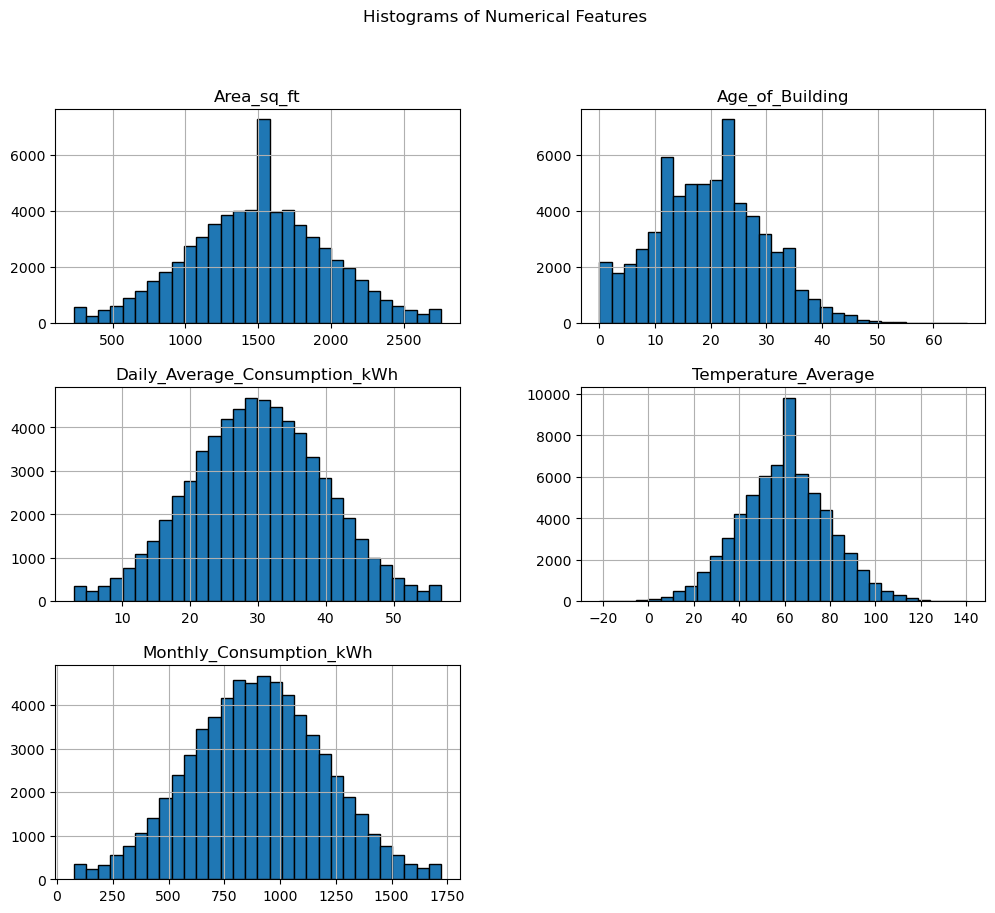

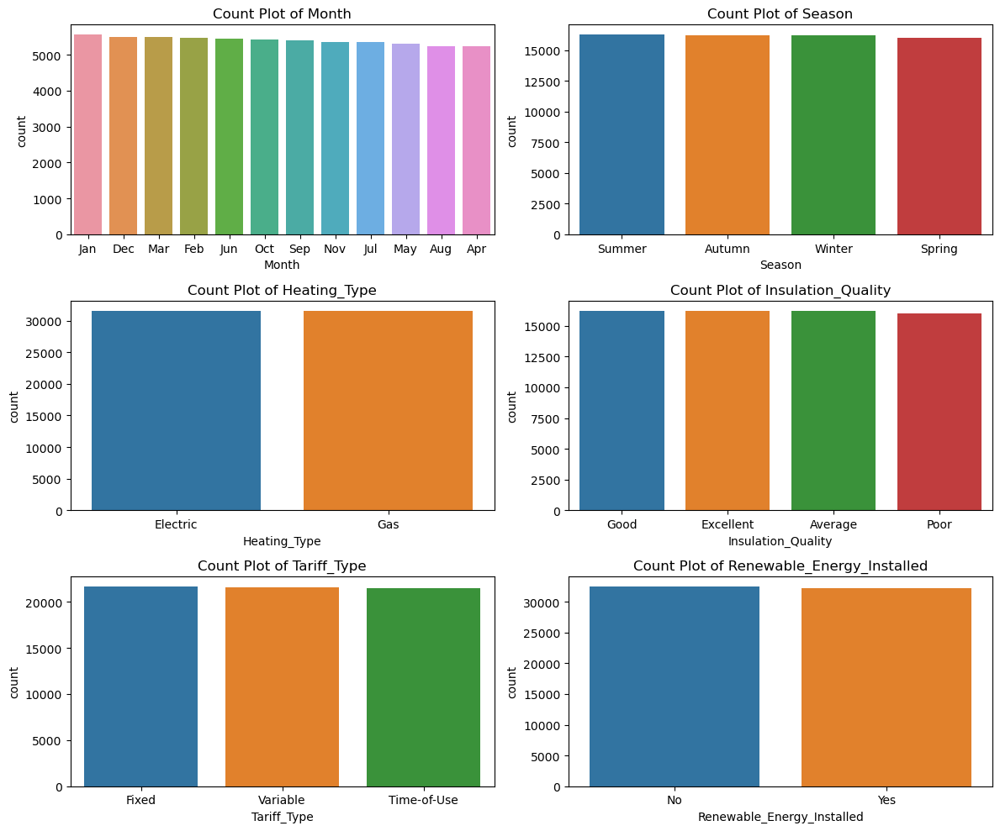

In [67]:
# Histograms for numerical features
numerical_features = ['Area_sq_ft', 'Age_of_Building', 'Daily_Average_Consumption_kWh', 'Temperature_Average', 'Monthly_Consumption_kWh']
data[numerical_features].hist(figsize=(12, 10), bins=30, edgecolor='black')
plt.suptitle('Histograms of Numerical Features')
plt.show()

# Count plots for categorical features
categorical_features = ['Month', 'Season', 'Heating_Type', 'Insulation_Quality', 'Tariff_Type', 'Renewable_Energy_Installed']
plt.figure(figsize=(12, 10))
for i, feature in enumerate(categorical_features, 1):
    plt.subplot(3, 2, i)
    sns.countplot(data=data, x=feature, order=data[feature].value_counts().index)
    plt.title(f'Count Plot of {feature}')
plt.tight_layout()
plt.show()

C:\Users\kreti\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\kreti\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\kreti\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\kreti\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

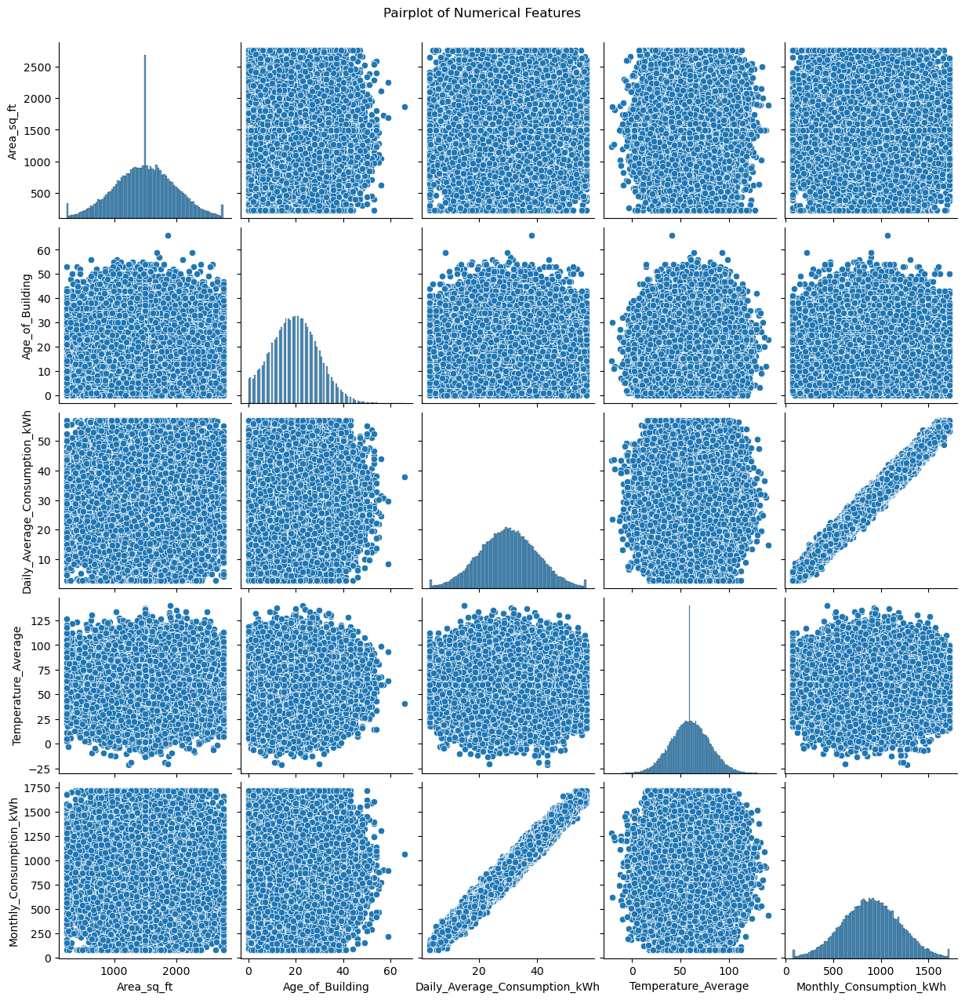

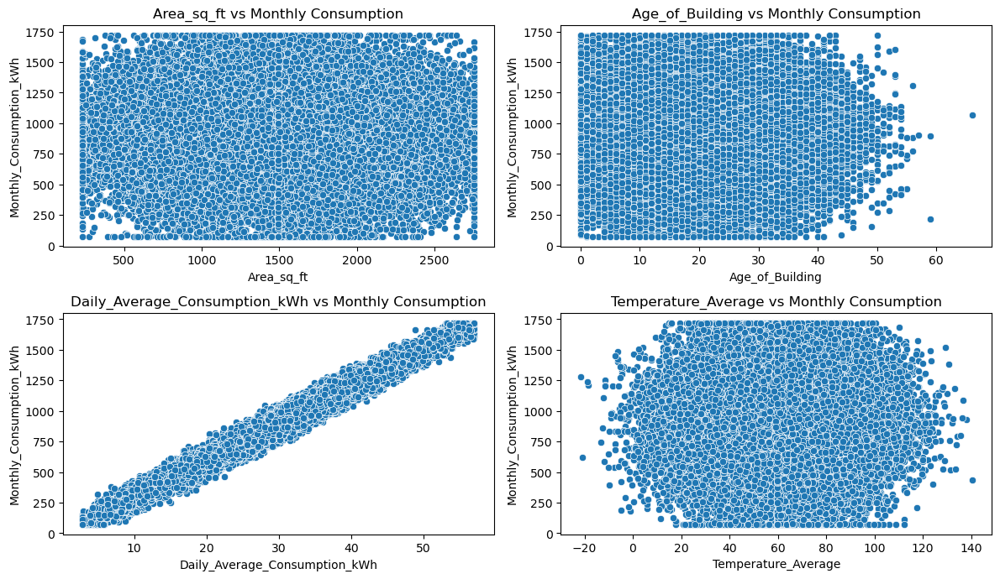

In [68]:
# Pairplot for numerical features
sns.pairplot(data[numerical_features])
plt.suptitle('Pairplot of Numerical Features', y=1.02)
plt.show()

# Scatter plot for numerical features vs Monthly_Consumption_kWh
plt.figure(figsize=(12, 10))
for i, feature in enumerate(numerical_features[:-1], 1):
    plt.subplot(3, 2, i)
    sns.scatterplot(data=data, x=feature, y='Monthly_Consumption_kWh')
    plt.title(f'{feature} vs Monthly Consumption')
plt.tight_layout()
plt.show()

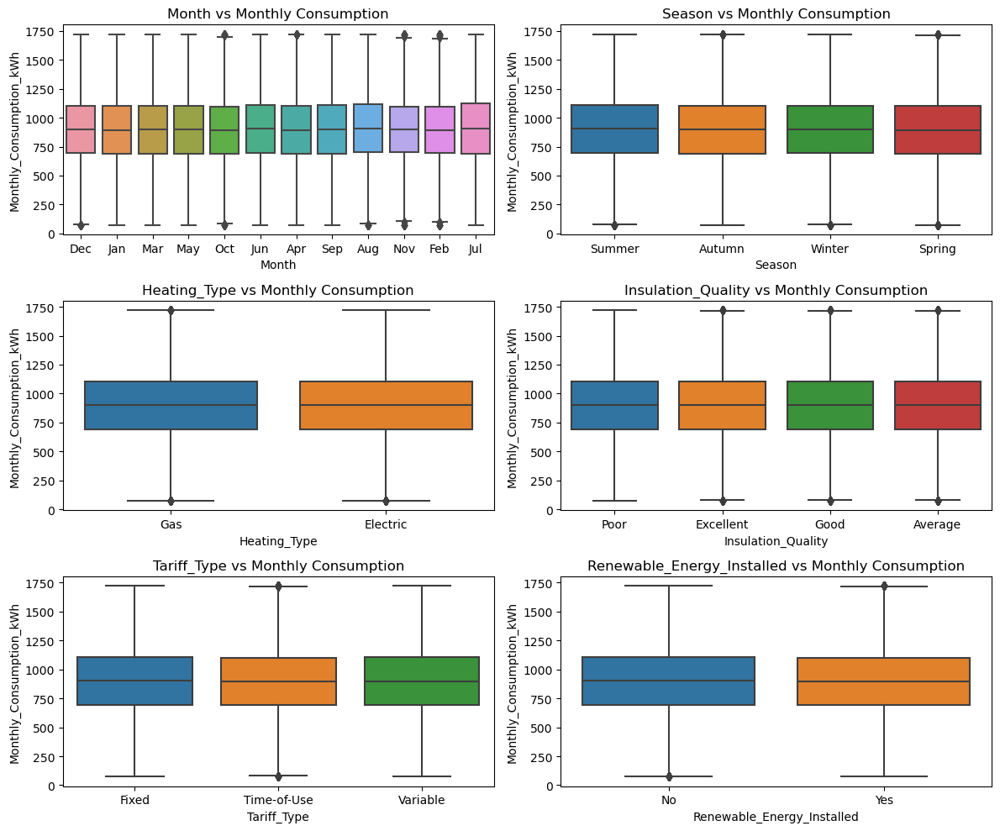

In [69]:
# Box plots for categorical features vs Monthly_Consumption_kWh column
plt.figure(figsize=(12, 10))
for i, feature in enumerate(categorical_features, 1):
    plt.subplot(3, 2, i)
    sns.boxplot(data=data, x=feature, y='Monthly_Consumption_kWh')
    plt.title(f'{feature} vs Monthly Consumption')
plt.tight_layout()
plt.show()

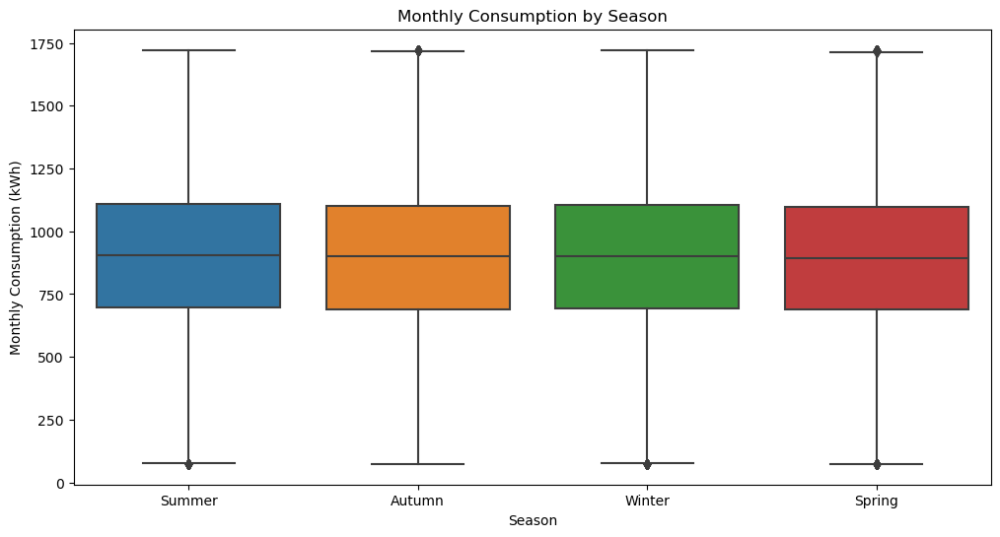

In [70]:
# Box Plot: Monthly Consumption by Season
plt.figure(figsize=(12, 6))
sns.boxplot(data=data, x='Season', y='Monthly_Consumption_kWh')
plt.title('Monthly Consumption by Season')
plt.xlabel('Season')
plt.ylabel('Monthly Consumption (kWh)')
plt.show()

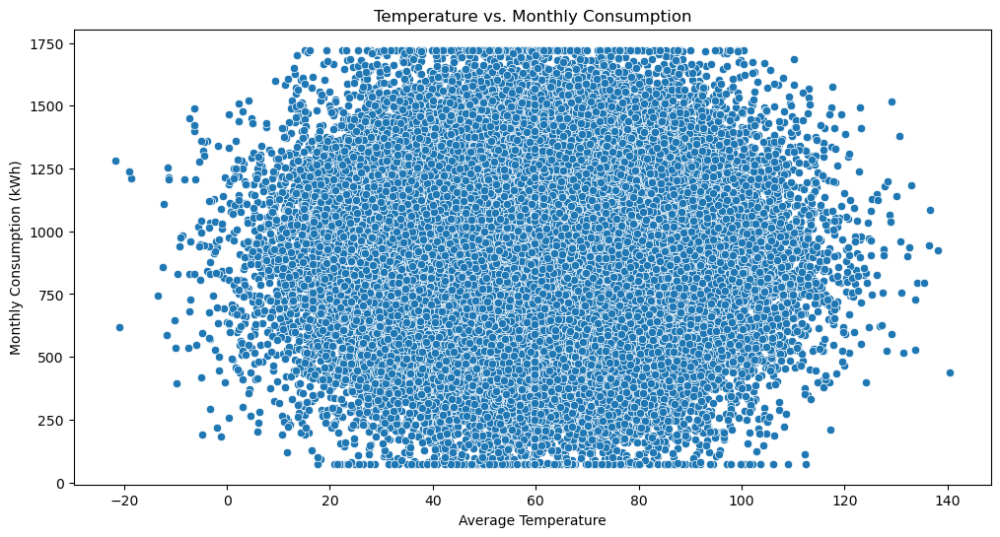

In [71]:
# Scatter Plot: Temperature vs. Monthly Consumption
plt.figure(figsize=(12, 6))
sns.scatterplot(data=data, x='Temperature_Average', y='Monthly_Consumption_kWh')
plt.title('Temperature vs. Monthly Consumption')
plt.xlabel('Average Temperature')
plt.ylabel('Monthly Consumption (kWh)')
plt.show()

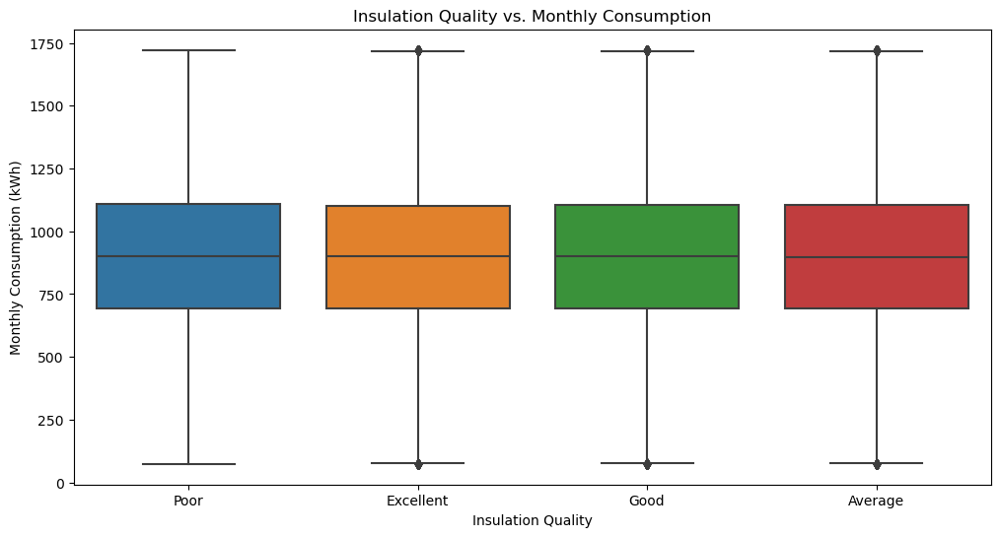

In [72]:
# Box Plot: Insulation Quality vs. Monthly Consumption
plt.figure(figsize=(12, 6))
sns.boxplot(data=data, x='Insulation_Quality', y='Monthly_Consumption_kWh')
plt.title('Insulation Quality vs. Monthly Consumption')
plt.xlabel('Insulation Quality')
plt.ylabel('Monthly Consumption (kWh)')
plt.show()

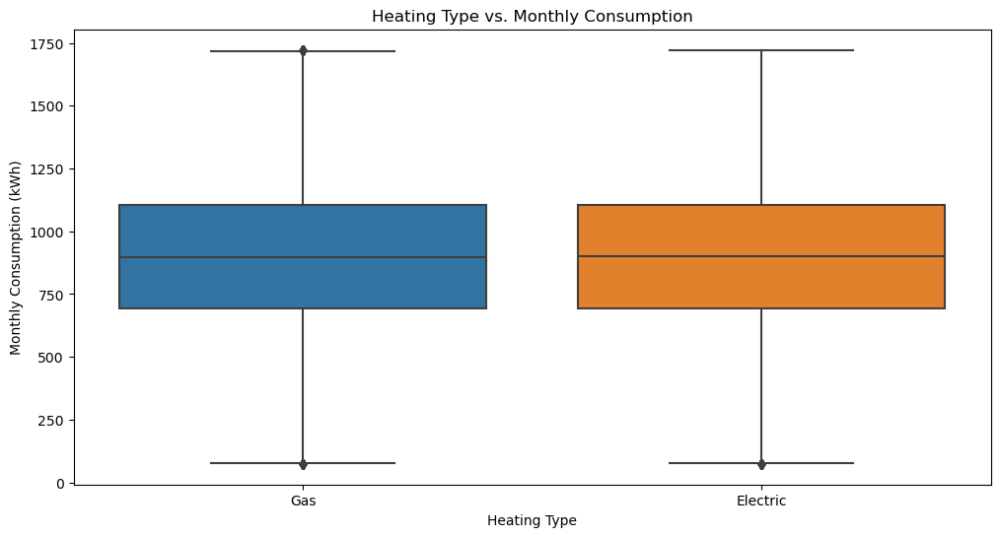

In [73]:
# Box Plot: Heating Type vs. Monthly Consumption
plt.figure(figsize=(12, 6))
sns.boxplot(data=data, x='Heating_Type', y='Monthly_Consumption_kWh')
plt.title('Heating Type vs. Monthly Consumption')
plt.xlabel('Heating Type')
plt.ylabel('Monthly Consumption (kWh)')
plt.show()


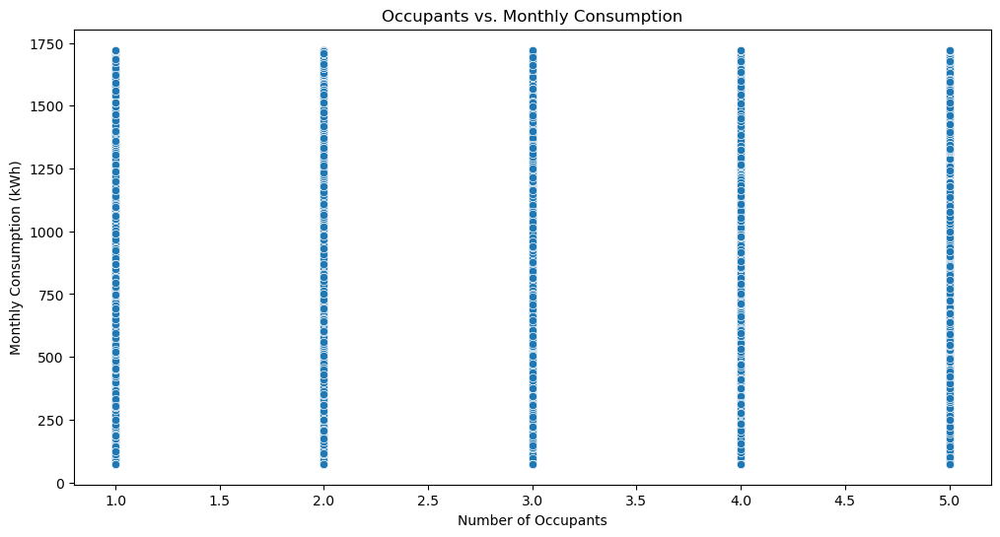

In [74]:
# Scatter Plot: Occupants vs. Monthly Consumption
plt.figure(figsize=(12, 6))
sns.scatterplot(data=data, x='Occupants', y='Monthly_Consumption_kWh')
plt.title('Occupants vs. Monthly Consumption')
plt.xlabel('Number of Occupants')
plt.ylabel('Monthly Consumption (kWh)')
plt.show()

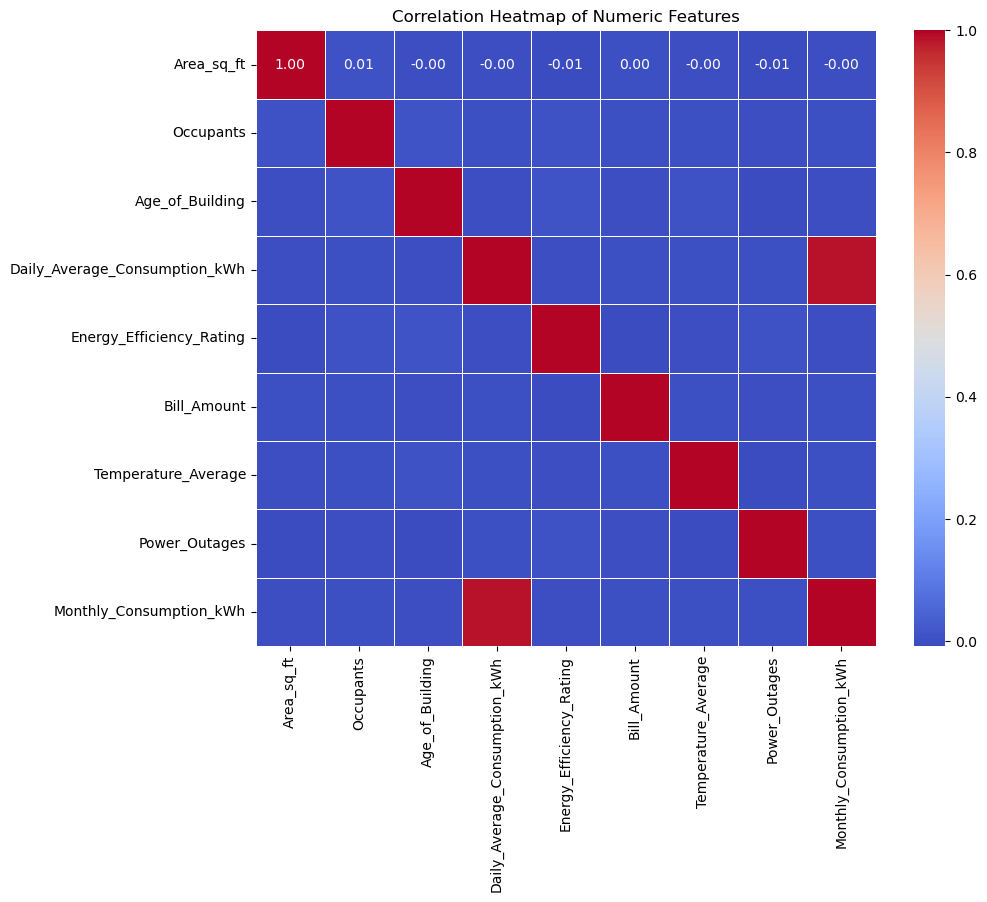

In [75]:
# Exclude non-numeric columns and compute correlation matrix
numeric_data = data.select_dtypes(include=[np.number])  # This will exclude non-numeric columns automatically
correlation_matrix = numeric_data.corr()

# Generate a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Heatmap of Numeric Features')
plt.show()

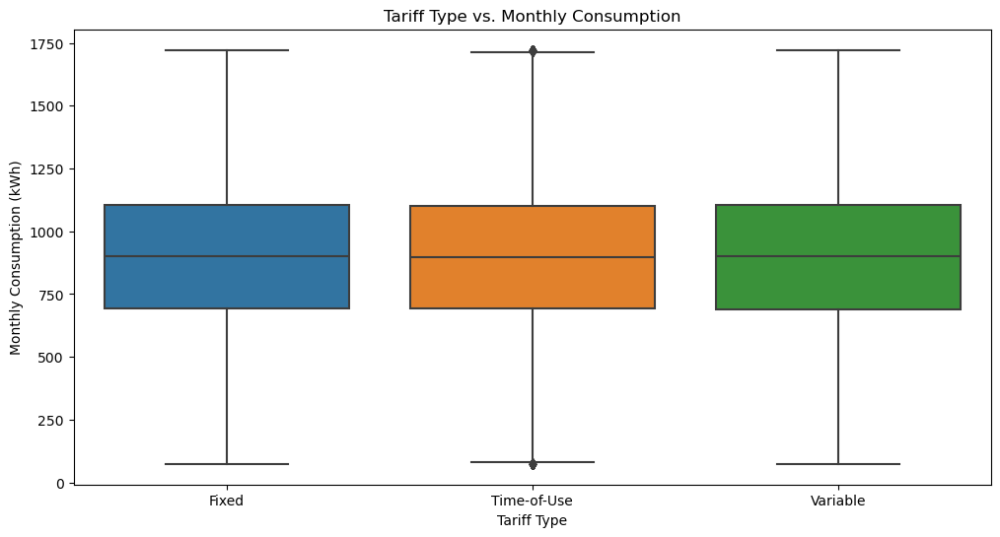

In [76]:
# Box Plot: Tariff Type vs. Monthly Consumption
plt.figure(figsize=(12, 6))
sns.boxplot(data=data, x='Tariff_Type', y='Monthly_Consumption_kWh')
plt.title('Tariff Type vs. Monthly Consumption')
plt.xlabel('Tariff Type')
plt.ylabel('Monthly Consumption (kWh)')
plt.show()


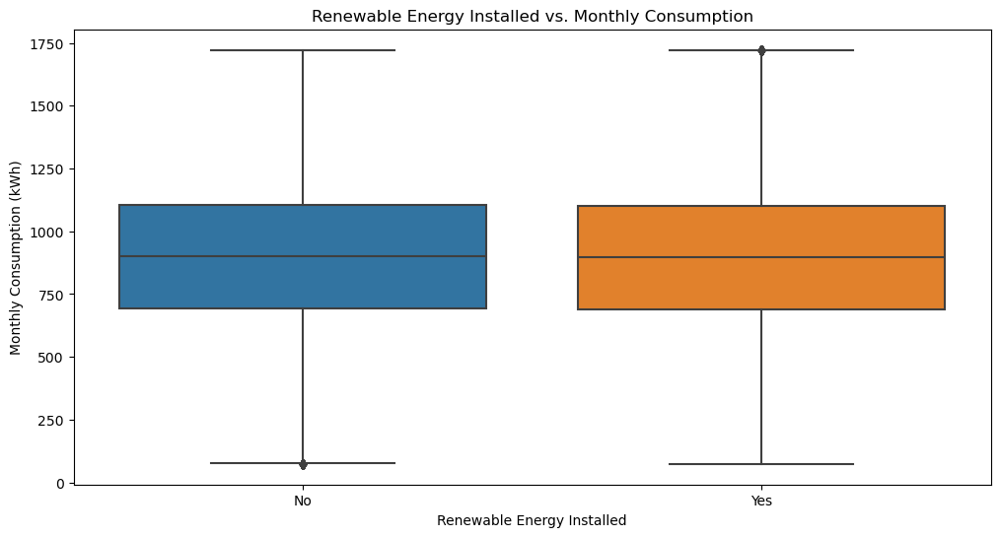

In [77]:
# Box Plot: Renewable Energy Installed against Monthly Consumption
plt.figure(figsize=(12, 6))
sns.boxplot(data=data, x='Renewable_Energy_Installed', y='Monthly_Consumption_kWh')
plt.title('Renewable Energy Installed vs. Monthly Consumption')
plt.xlabel('Renewable Energy Installed')
plt.ylabel('Monthly Consumption (kWh)')
plt.show()

C:\Users\kreti\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\kreti\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\kreti\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\kreti\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

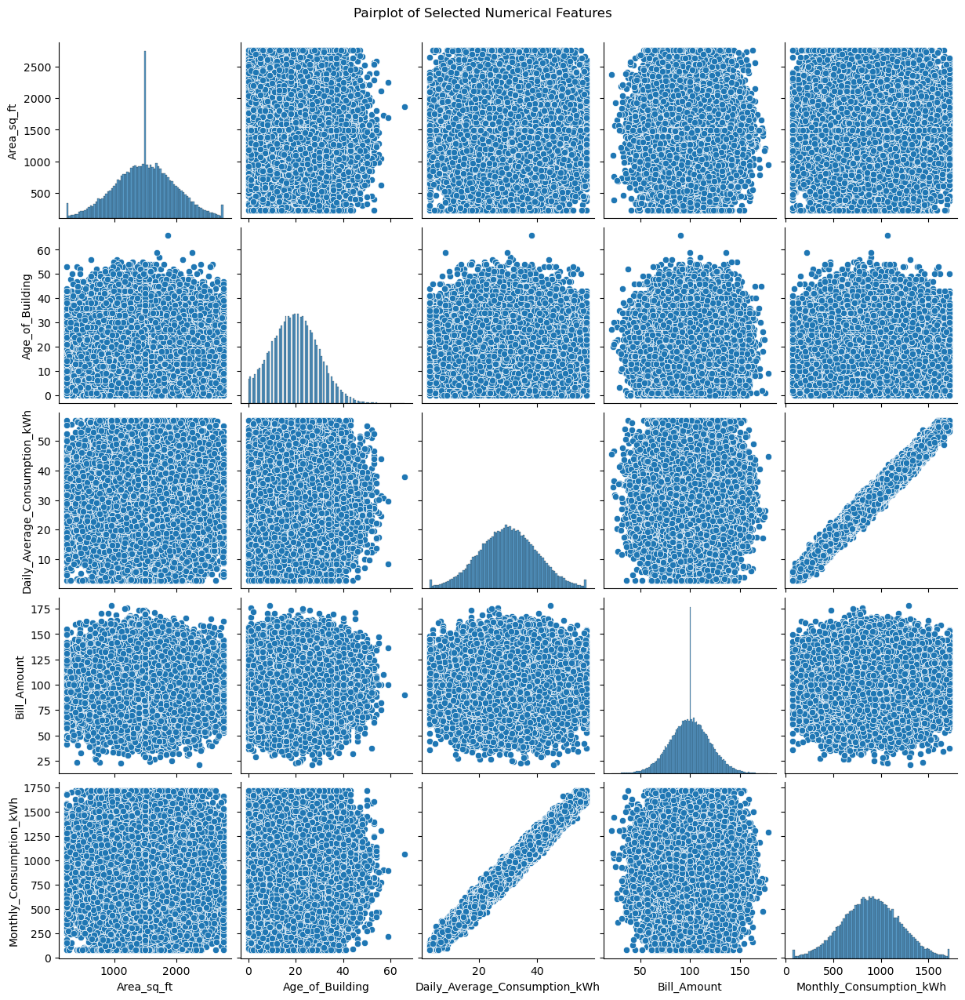

In [78]:
# Pairplot for some numerical features
selected_features = ['Area_sq_ft', 'Age_of_Building', 'Daily_Average_Consumption_kWh', 'Bill_Amount', 'Monthly_Consumption_kWh']
sns.pairplot(data[selected_features])
plt.suptitle('Pairplot of Selected Numerical Features', y=1.02)
plt.show()

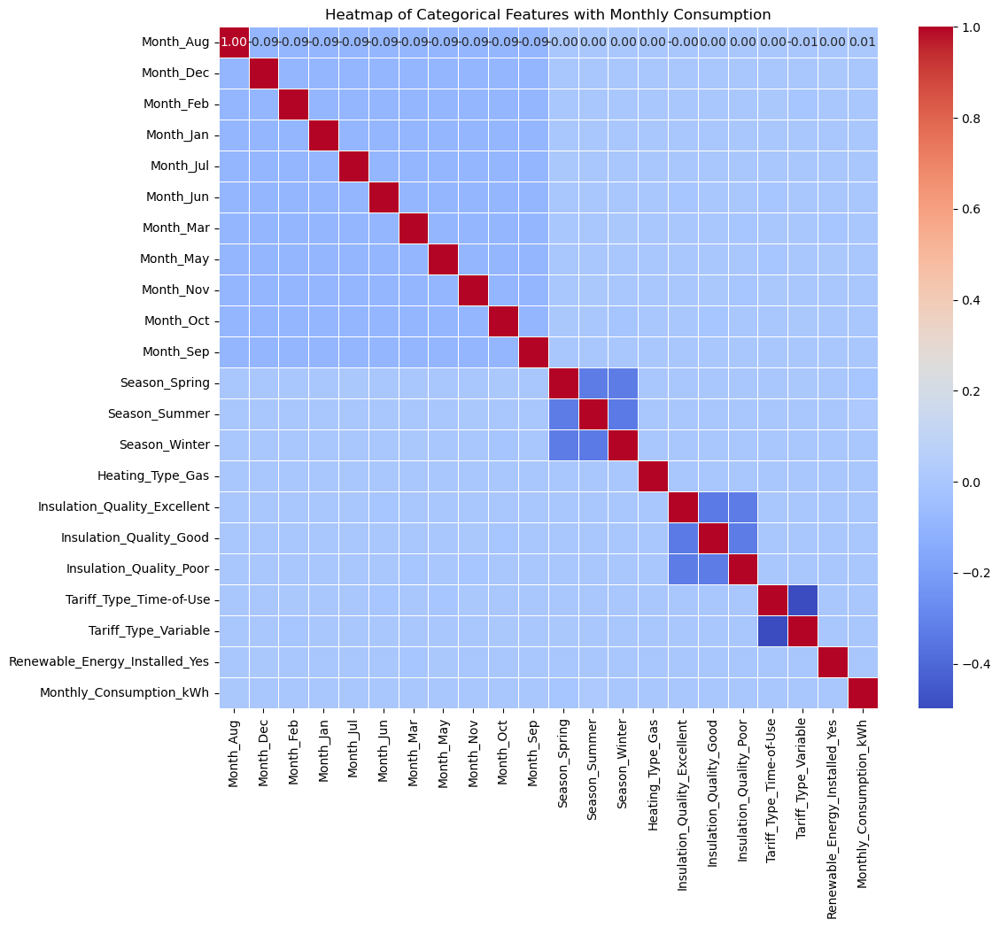

In [79]:
# Convert categorical features to dummy variables
categorical_features = ['Month', 'Season', 'Heating_Type', 'Insulation_Quality', 'Tariff_Type', 'Renewable_Energy_Installed']
data_dummies = pd.get_dummies(data[categorical_features], drop_first=True)

# Add Monthly_Consumption_kWh to the dummy dataframe
data_dummies['Monthly_Consumption_kWh'] = data['Monthly_Consumption_kWh']

# Generate heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(data_dummies.corr(), annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Heatmap of Categorical Features with Monthly Consumption')
plt.show()

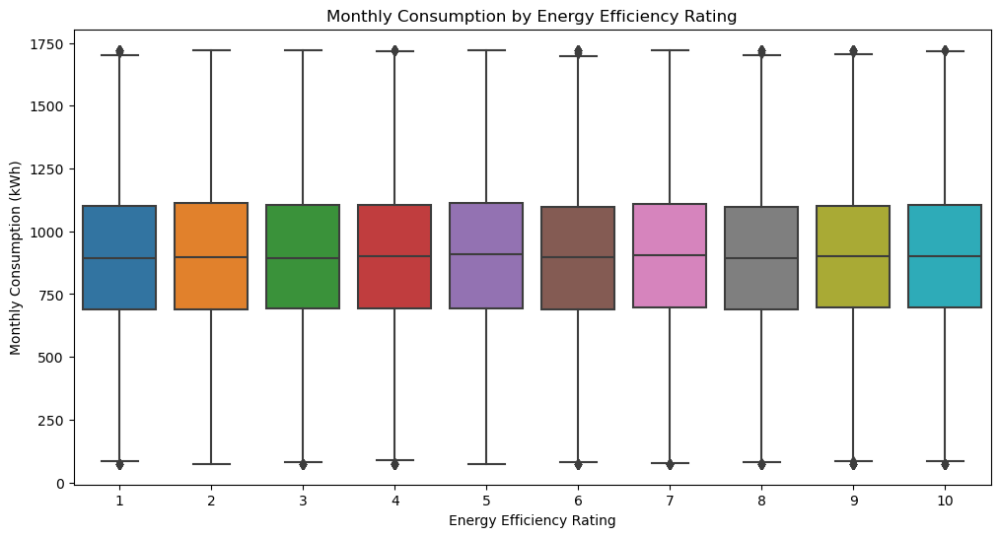

In [80]:
# Box Plot: Monthly Consumption by Energy Efficiency Rating
plt.figure(figsize=(12, 6))
sns.boxplot(data=data, x='Energy_Efficiency_Rating', y='Monthly_Consumption_kWh')
plt.title('Monthly Consumption by Energy Efficiency Rating')
plt.xlabel('Energy Efficiency Rating')
plt.ylabel('Monthly Consumption (kWh)')
plt.show()

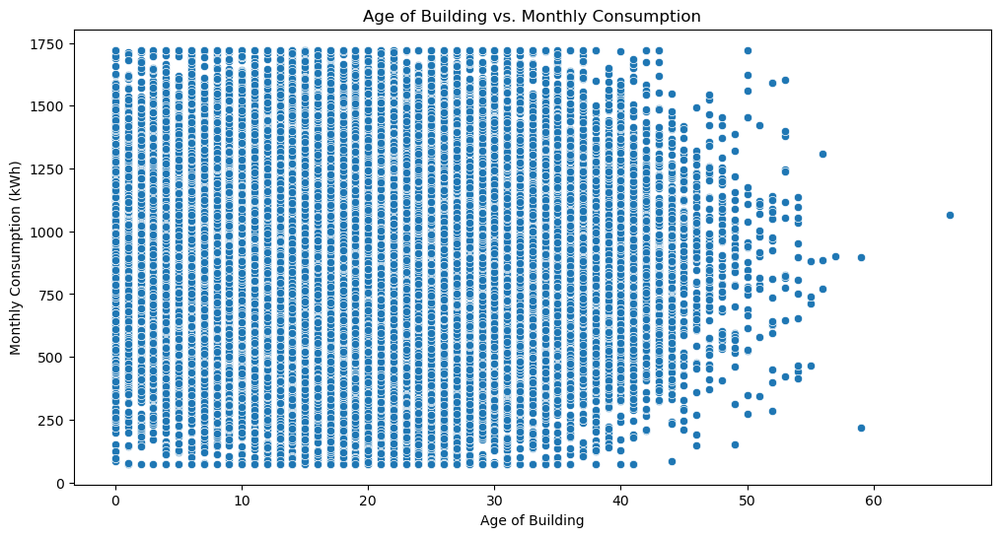

In [81]:
# Scatter Plot: Age of Building vs. Monthly Consumption
plt.figure(figsize=(12, 6))
sns.scatterplot(data=data, x='Age_of_Building', y='Monthly_Consumption_kWh')
plt.title('Age of Building vs. Monthly Consumption')
plt.xlabel('Age of Building')
plt.ylabel('Monthly Consumption (kWh)')
plt.show()

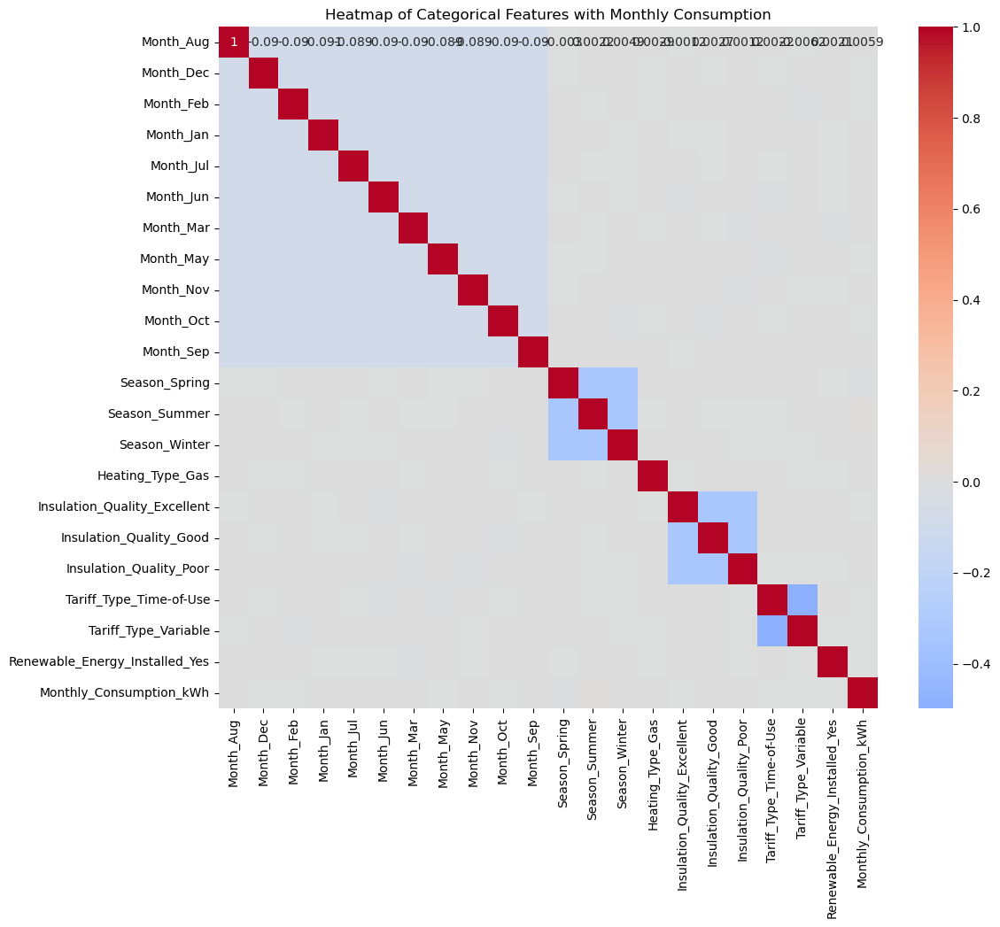

In [82]:
# Heatmap of Categorical Features with Monthly Consumption
categorical_columns = ['Month', 'Season', 'Heating_Type', 'Insulation_Quality', 'Tariff_Type', 'Renewable_Energy_Installed']
data_encoded = pd.get_dummies(data[categorical_columns], drop_first=True)
data_encoded['Monthly_Consumption_kWh'] = data['Monthly_Consumption_kWh']
plt.figure(figsize=(12, 10))
sns.heatmap(data_encoded.corr(), annot=True, cmap='coolwarm', center=0)
plt.title('Heatmap of Categorical Features with Monthly Consumption')
plt.show()


C:\Users\kreti\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\kreti\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\kreti\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\kreti\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

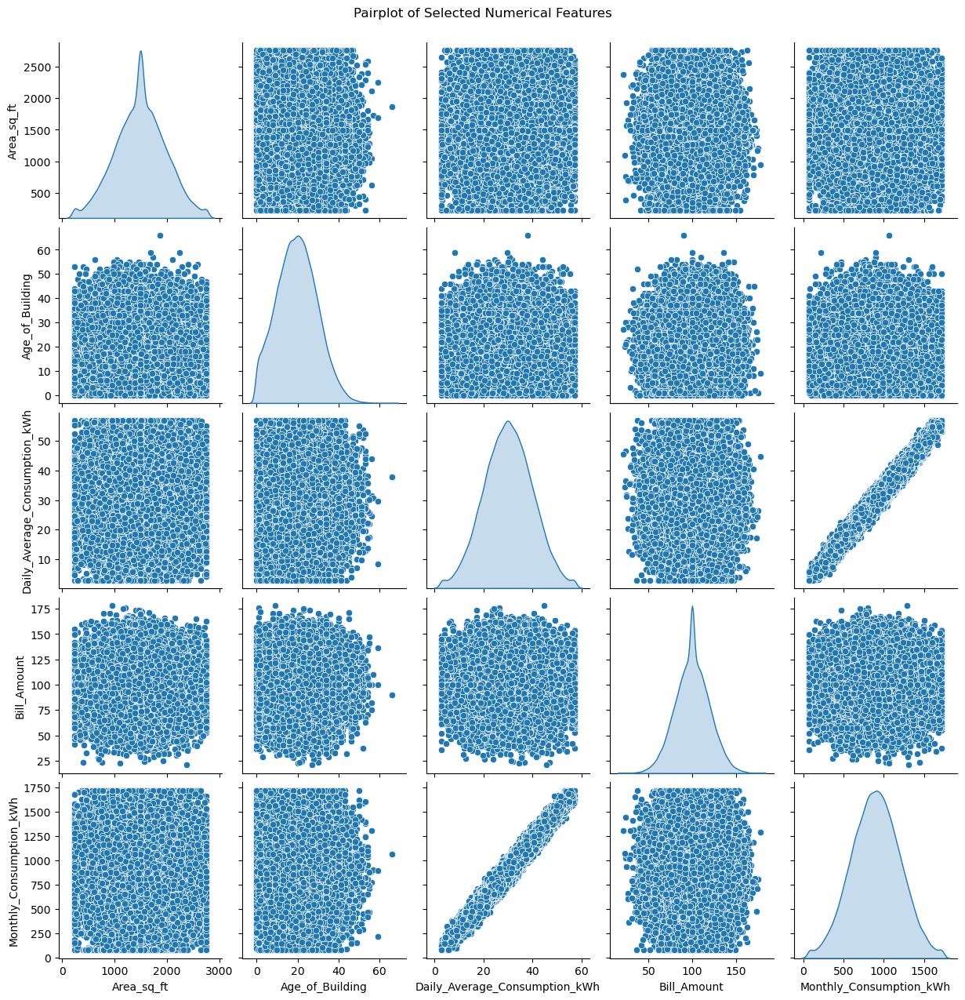

In [83]:
# Pairplot for numerical features
selected_features = ['Area_sq_ft', 'Age_of_Building', 'Daily_Average_Consumption_kWh', 'Bill_Amount', 'Monthly_Consumption_kWh']
sns.pairplot(data[selected_features], diag_kind='kde')
plt.suptitle('Pairplot of Selected Numerical Features', y=1.02)
plt.show()

In [84]:
# Load the dataset
data = pd.read_csv('Cleaned_Energy_Consumption_Data.csv')

# Replace nan values with 'None'
data['Heating_Type'] = data['Heating_Type'].fillna('None')

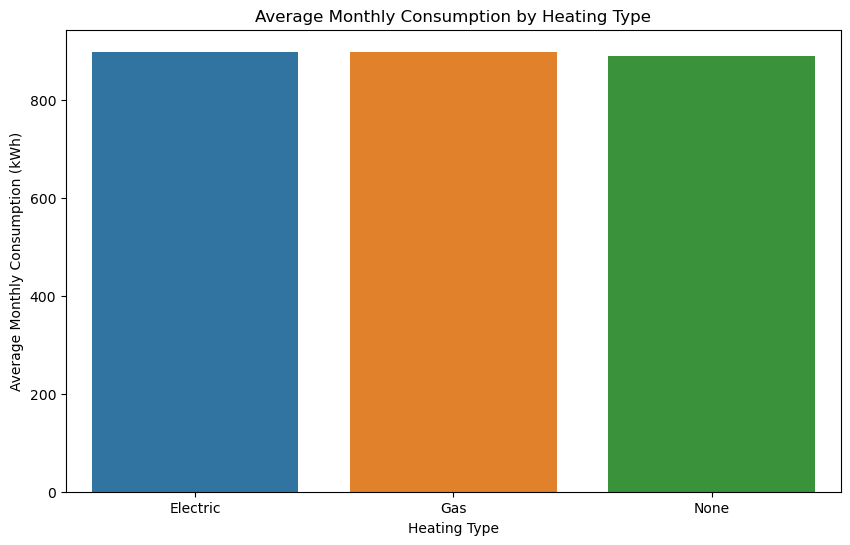

In [85]:
# Average monthly consumption by heating type
heating_avg_consumption = data.groupby('Heating_Type')['Monthly_Consumption_kWh'].mean().reset_index()

plt.figure(figsize=(10, 6))
sns.barplot(data=heating_avg_consumption, x='Heating_Type', y='Monthly_Consumption_kWh')
plt.title('Average Monthly Consumption by Heating Type')
plt.xlabel('Heating Type')
plt.ylabel('Average Monthly Consumption (kWh)')
plt.show()


In [86]:
# Save the cleaned data to a new CSV file
data.to_csv('Cleaned_Energy_Consumption_Data.csv', index=False)

# Verify the saved file
saved_data = pd.read_csv('Cleaned_Energy_Consumption_Data.csv')

C:\Users\kreti\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


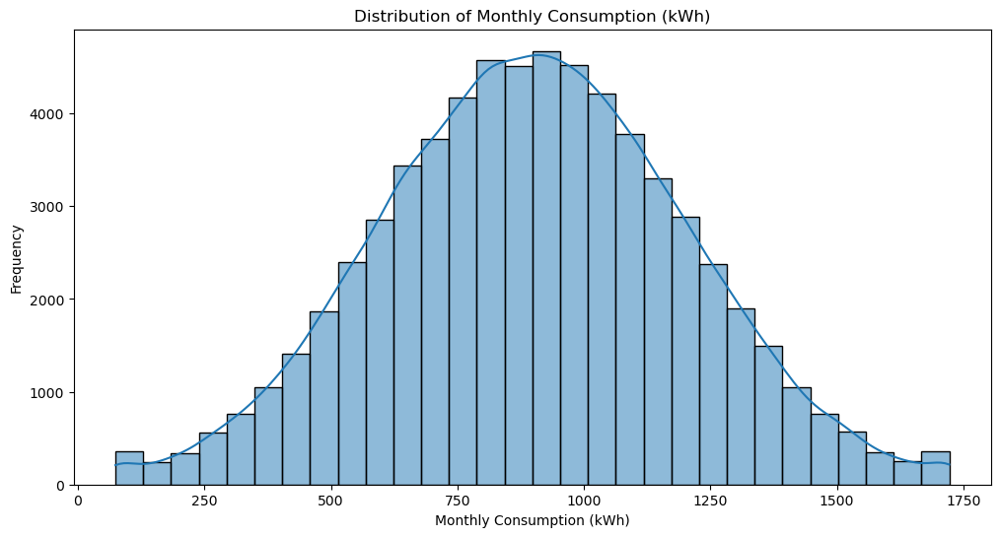

In [87]:
plt.figure(figsize=(12, 6))
sns.histplot(data['Monthly_Consumption_kWh'], bins=30, kde=True)
plt.title('Distribution of Monthly Consumption (kWh)')
plt.xlabel('Monthly Consumption (kWh)')
plt.ylabel('Frequency')
plt.show()

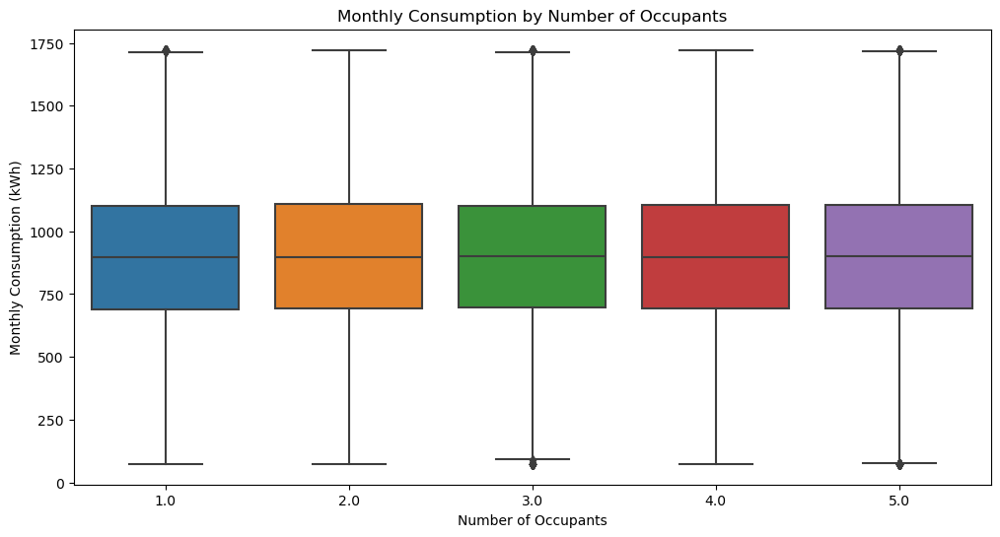

In [88]:
plt.figure(figsize=(12, 6))
sns.boxplot(data=data, x='Occupants', y='Monthly_Consumption_kWh')
plt.title('Monthly Consumption by Number of Occupants')
plt.xlabel('Number of Occupants')
plt.ylabel('Monthly Consumption (kWh)')
plt.show()

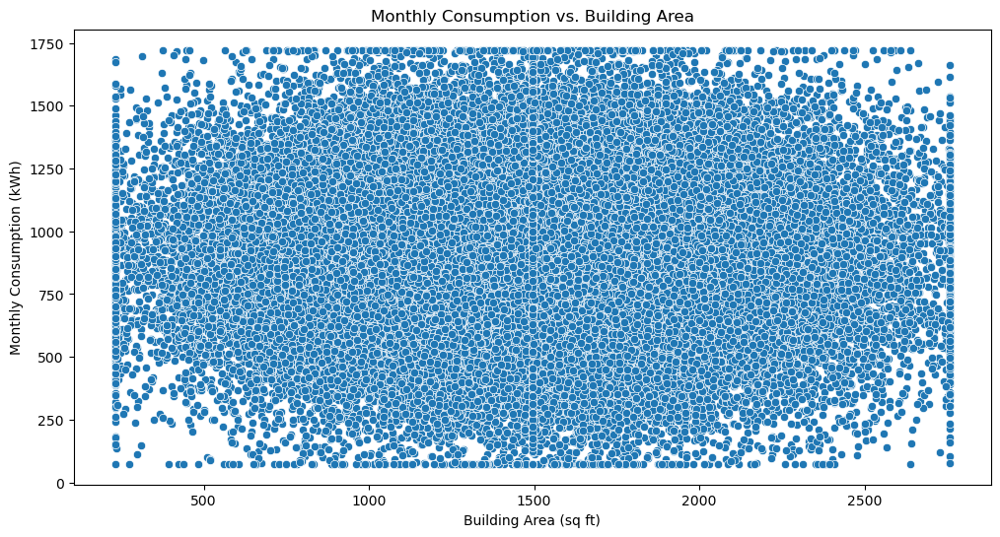

In [89]:
plt.figure(figsize=(12, 6))
sns.scatterplot(data=data, x='Area_sq_ft', y='Monthly_Consumption_kWh')
plt.title('Monthly Consumption vs. Building Area')
plt.xlabel('Building Area (sq ft)')
plt.ylabel('Monthly Consumption (kWh)')
plt.show()


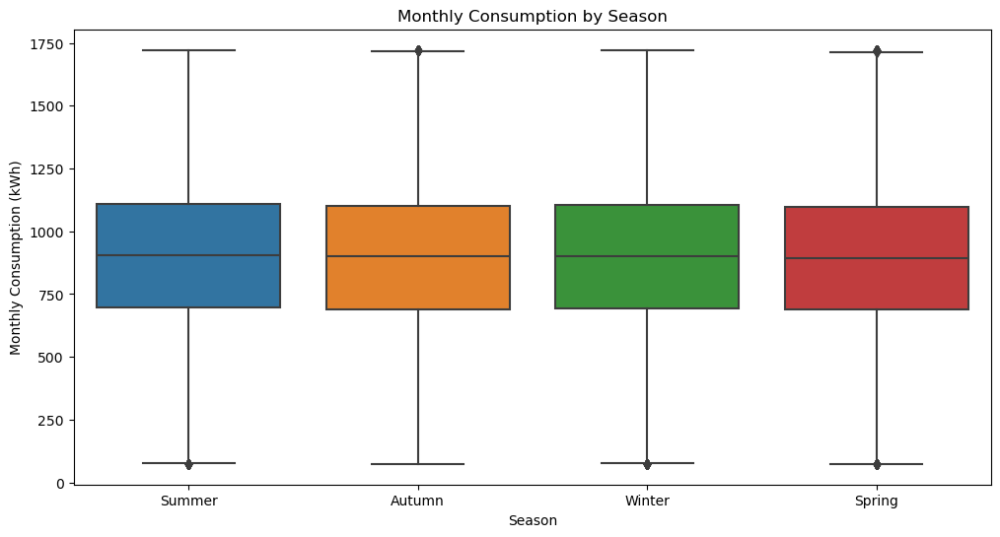

In [90]:
plt.figure(figsize=(12, 6))
sns.boxplot(data=data, x='Season', y='Monthly_Consumption_kWh')
plt.title('Monthly Consumption by Season')
plt.xlabel('Season')
plt.ylabel('Monthly Consumption (kWh)')
plt.show()

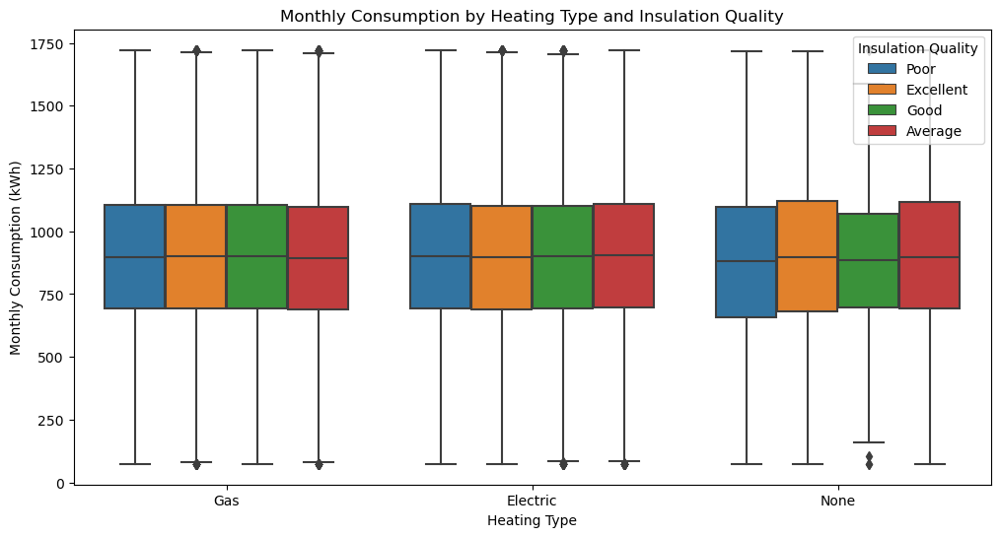

In [91]:
plt.figure(figsize=(12, 6))
sns.boxplot(data=data, x='Heating_Type', y='Monthly_Consumption_kWh', hue='Insulation_Quality')
plt.title('Monthly Consumption by Heating Type and Insulation Quality')
plt.xlabel('Heating Type')
plt.ylabel('Monthly Consumption (kWh)')
plt.legend(title='Insulation Quality')
plt.show()

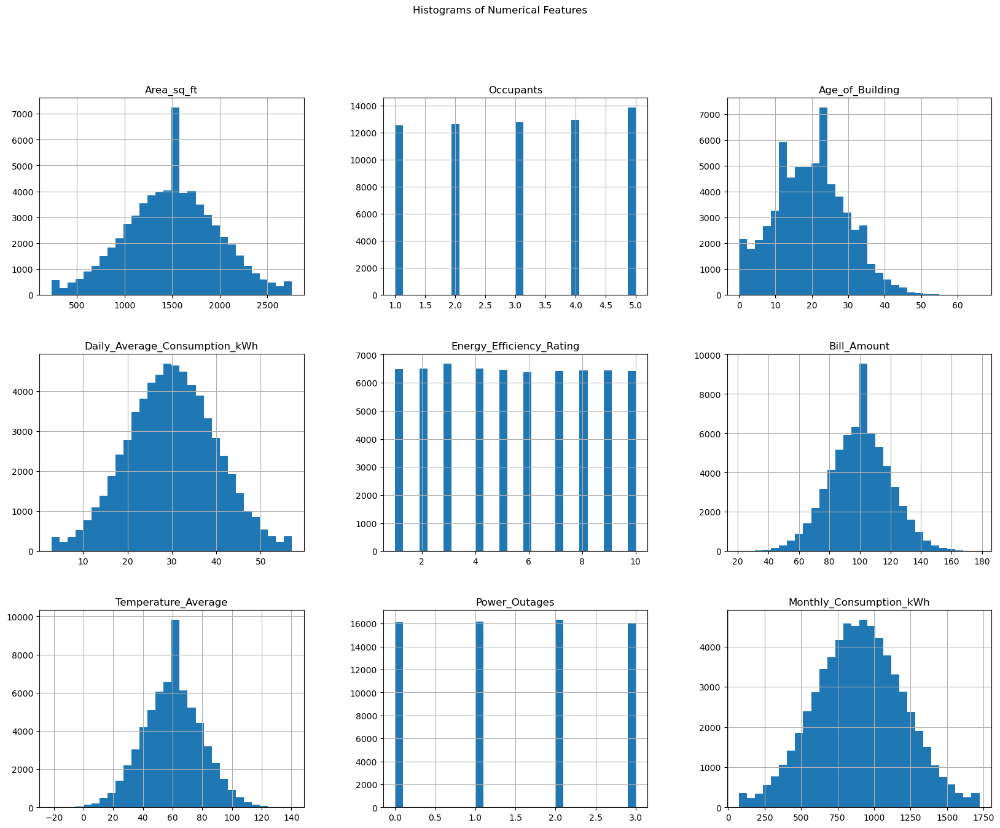

In [92]:
#more histograms
data.hist(bins=30, figsize=(20, 15))
plt.suptitle('Histograms of Numerical Features')
plt.show()


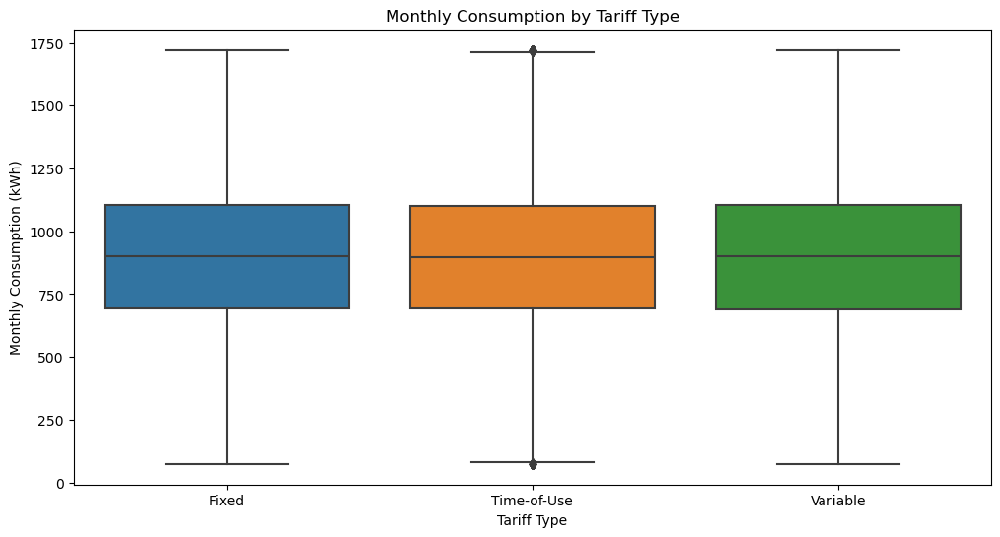

In [93]:
plt.figure(figsize=(12, 6))
sns.boxplot(data=data, x='Tariff_Type', y='Monthly_Consumption_kWh')
plt.title('Monthly Consumption by Tariff Type')
plt.xlabel('Tariff Type')
plt.ylabel('Monthly Consumption (kWh)')
plt.show()


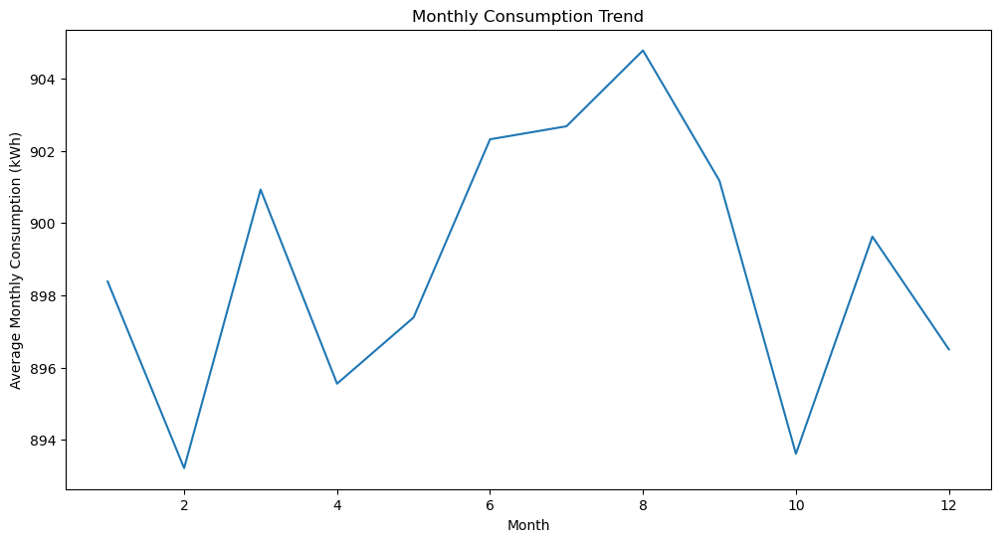

In [94]:
data['Month'] = pd.to_datetime(data['Month'], format='%b')
monthly_trend = data.groupby(data['Month'].dt.month)['Monthly_Consumption_kWh'].mean()
plt.figure(figsize=(12, 6))
monthly_trend.plot()
plt.title('Monthly Consumption Trend')
plt.xlabel('Month')
plt.ylabel('Average Monthly Consumption (kWh)')
plt.show()


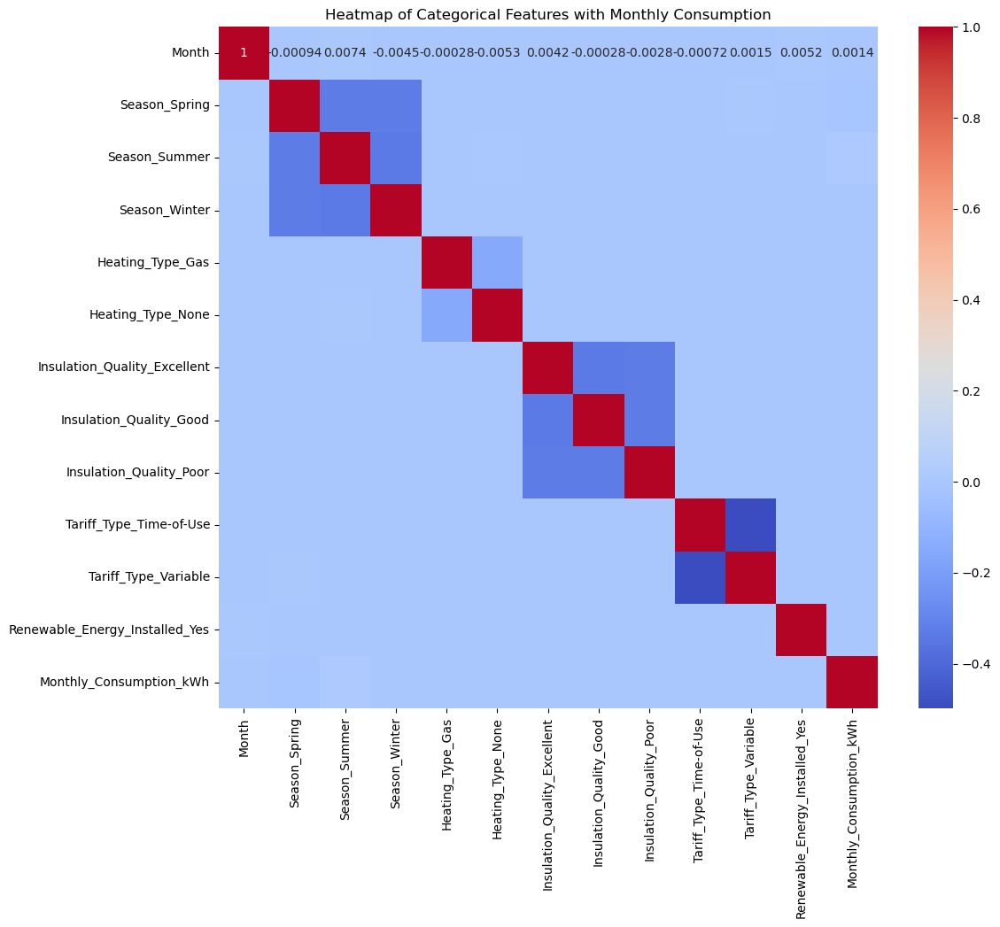

In [95]:
categorical_columns = ['Month', 'Season', 'Heating_Type', 'Insulation_Quality', 'Tariff_Type', 'Renewable_Energy_Installed']
data_encoded = pd.get_dummies(data[categorical_columns], drop_first=True)
data_encoded['Monthly_Consumption_kWh'] = data['Monthly_Consumption_kWh']

plt.figure(figsize=(12, 10))
sns.heatmap(data_encoded.corr(), annot=True, cmap='coolwarm')
plt.title('Heatmap of Categorical Features with Monthly Consumption')
plt.show()


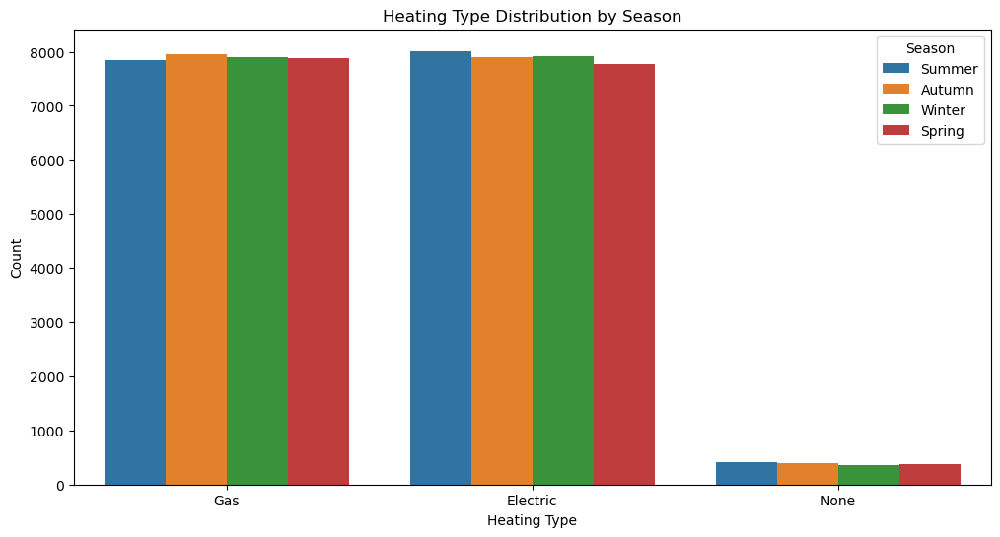

In [96]:
plt.figure(figsize=(12, 6))
sns.countplot(data=data, x='Heating_Type', hue='Season')
plt.title('Heating Type Distribution by Season')
plt.xlabel('Heating Type')
plt.ylabel('Count')
plt.show()

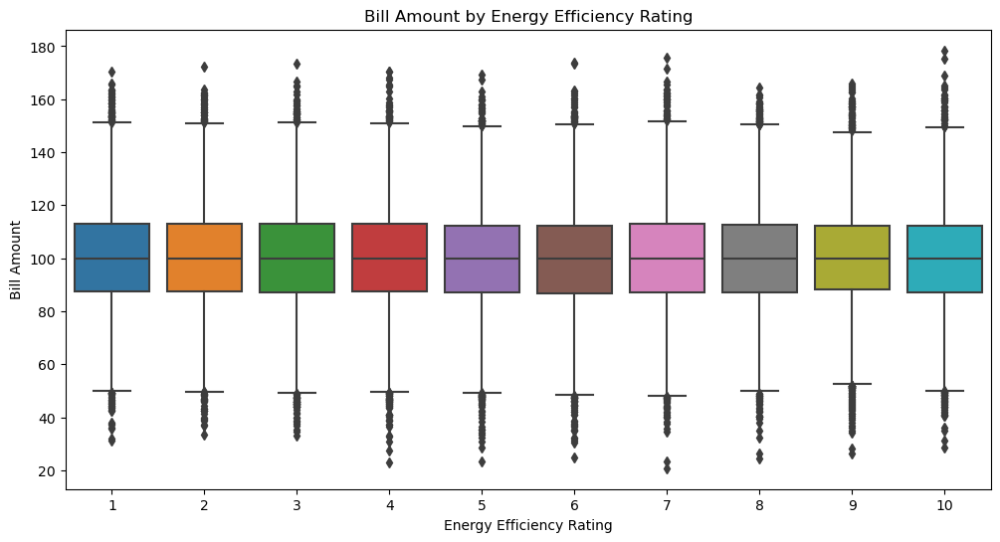

In [97]:
plt.figure(figsize=(12, 6))
sns.boxplot(data=data, x='Energy_Efficiency_Rating', y='Bill_Amount')
plt.title('Bill Amount by Energy Efficiency Rating')
plt.xlabel('Energy Efficiency Rating')
plt.ylabel('Bill Amount')
plt.show()


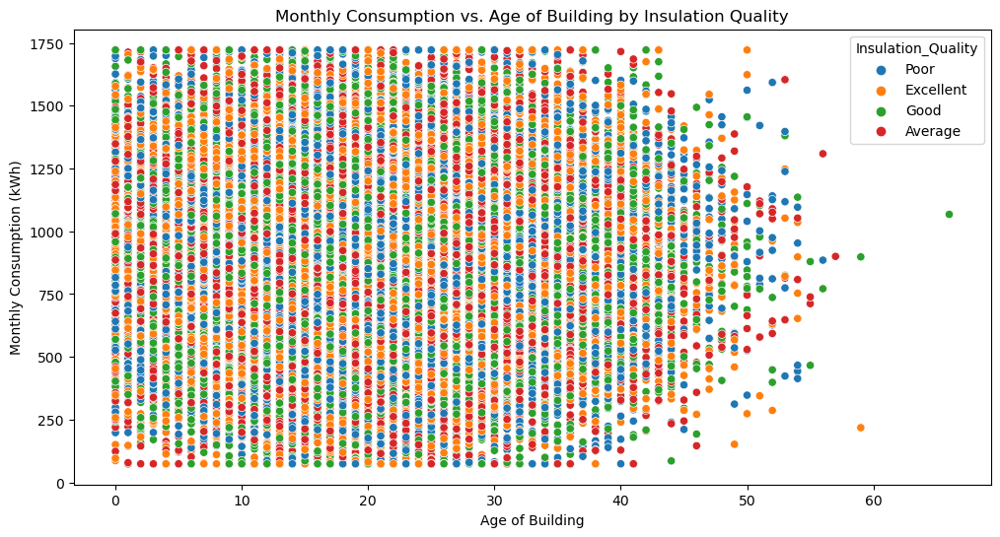

In [98]:
plt.figure(figsize=(12, 6))
sns.scatterplot(data=data, x='Age_of_Building', y='Monthly_Consumption_kWh', hue='Insulation_Quality')
plt.title('Monthly Consumption vs. Age of Building by Insulation Quality')
plt.xlabel('Age of Building')
plt.ylabel('Monthly Consumption (kWh)')
plt.show()

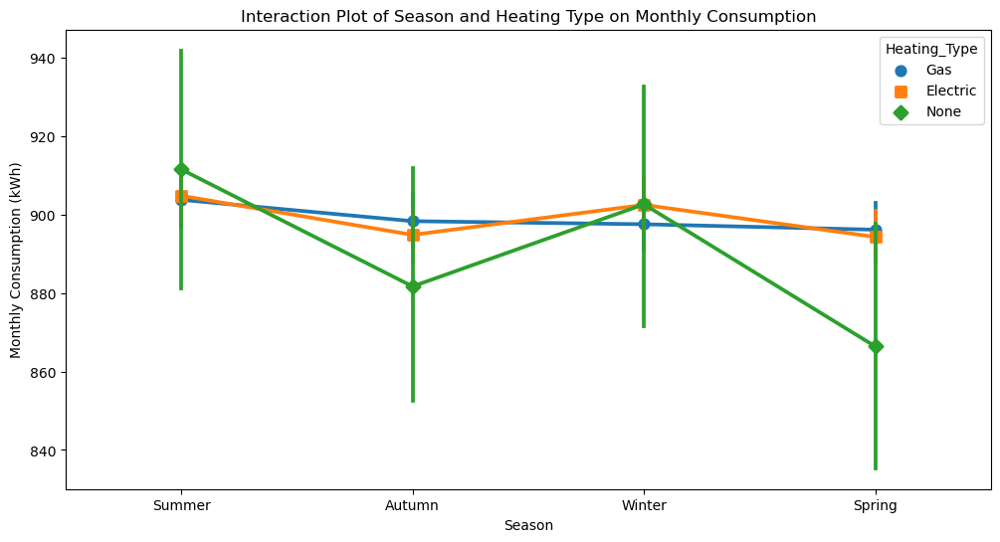

In [99]:
plt.figure(figsize=(12, 6))
sns.pointplot(data=data, x='Season', y='Monthly_Consumption_kWh', hue='Heating_Type', markers=['o', 's', 'D'])
plt.title('Interaction Plot of Season and Heating Type on Monthly Consumption')
plt.xlabel('Season')
plt.ylabel('Monthly Consumption (kWh)')
plt.show()


In [100]:
#Going to move onto modelling now

In [101]:
# Load the cleaned data
data = pd.read_csv('cleaned_Energy_Consumption_Data.csv')

# Define the features (X) and the target variable (y)
X = data.drop(columns=['Monthly_Consumption_kWh'])
y = data['Monthly_Consumption_kWh']

# Create dummy variables for categorical features
X = pd.get_dummies(X, drop_first=True)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)


In [102]:
# Vanilla Linear Regression
vanilla_lr = LinearRegression()
vanilla_lr.fit(X_train_scaled, y_train)

# Predictions
y_pred_vanilla = vanilla_lr.predict(X_test_scaled)

# Evaluation
rmse_vanilla = mean_squared_error(y_test, y_pred_vanilla, squared=False)
r2_vanilla = r2_score(y_test, y_pred_vanilla)

print(f'Vanilla Linear Regression RMSE: {rmse_vanilla}')
print(f'Vanilla Linear Regression R²: {r2_vanilla}')


Vanilla Linear Regression RMSE: 49.56308784368111
Vanilla Linear Regression R²: 0.9733207045441057


In [103]:
# Ridge Regression
ridge_lr = Ridge()
ridge_lr.fit(X_train_scaled, y_train)

# Predictions
y_pred_ridge = ridge_lr.predict(X_test_scaled)

# Evaluation
rmse_ridge = mean_squared_error(y_test, y_pred_ridge, squared=False)
r2_ridge = r2_score(y_test, y_pred_ridge)

print(f'Ridge Regression RMSE: {rmse_ridge}')
print(f'Ridge Regression R²: {r2_ridge}')


Ridge Regression RMSE: 49.563154635257554
Ridge Regression R²: 0.9733206326376334


In [104]:
# Lasso Regression
lasso_lr = Lasso()
lasso_lr.fit(X_train_scaled, y_train)

# Predictions
y_pred_lasso = lasso_lr.predict(X_test_scaled)

# Evaluation
rmse_lasso = mean_squared_error(y_test, y_pred_lasso, squared=False)
r2_lasso = r2_score(y_test, y_pred_lasso)

print(f'Lasso Regression RMSE: {rmse_lasso}')
print(f'Lasso Regression R²: {r2_lasso}')


Lasso Regression RMSE: 49.57111114764105
Lasso Regression R²: 0.9733120661225722


In [105]:
# Hyperparameter tuning for Ridge
ridge_params = {'alpha': [0.1, 1, 10, 100]}
ridge_grid = GridSearchCV(Ridge(), ridge_params, cv=5)
ridge_grid.fit(X_train_scaled, y_train)

print(f'Best Ridge alpha: {ridge_grid.best_params_["alpha"]}')

# Hyperparameter tuning for Lasso
lasso_params = {'alpha': [0.01, 0.1, 1, 10]}
lasso_grid = GridSearchCV(Lasso(), lasso_params, cv=5)
lasso_grid.fit(X_train_scaled, y_train)

print(f'Best Lasso alpha: {lasso_grid.best_params_["alpha"]}')

Best Ridge alpha: 0.1
Best Lasso alpha: 0.1


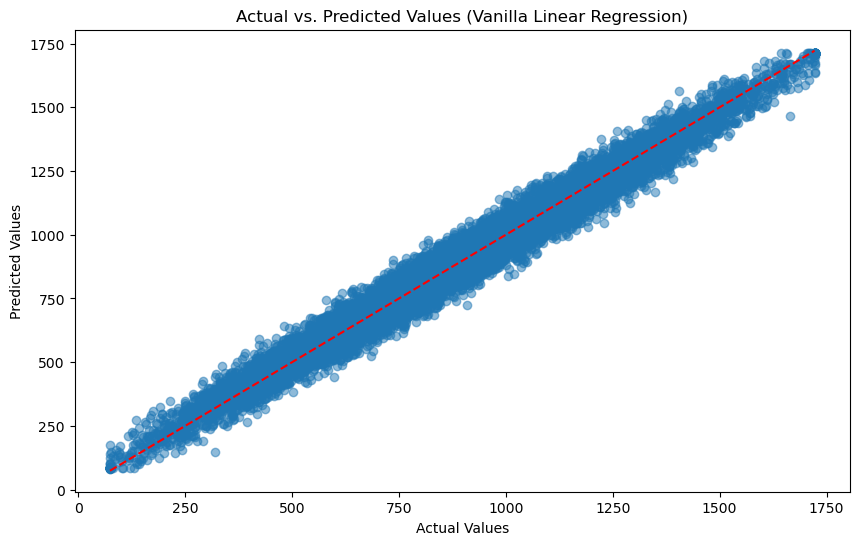

In [106]:
# Scatter plot of Actual vs. Predicted values for Vanilla Linear Regression
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_vanilla, alpha=0.5)
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--')
plt.title('Actual vs. Predicted Values (Vanilla Linear Regression)')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.show()

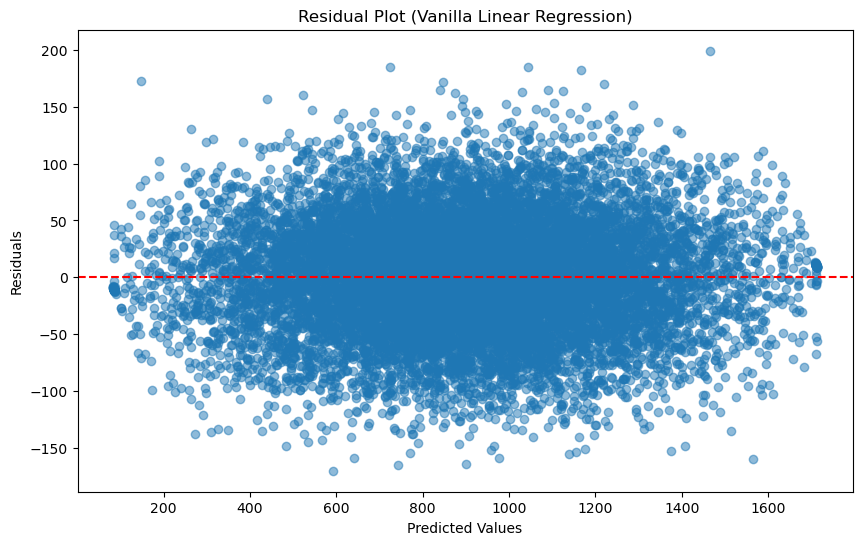

In [107]:
# Residual plot for Vanilla Linear Regression
plt.figure(figsize=(10, 6))
residuals_vanilla = y_test - y_pred_vanilla
plt.scatter(y_pred_vanilla, residuals_vanilla, alpha=0.5)
plt.axhline(0, color='red', linestyle='--')
plt.title('Residual Plot (Vanilla Linear Regression)')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.show()

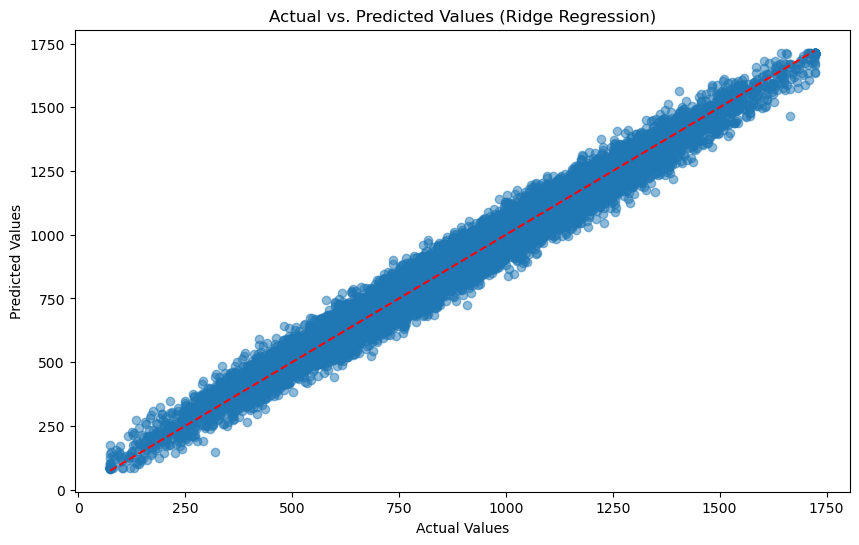

In [108]:
# Scatter plot of Actual vs. Predicted values for Ridge Regression
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_ridge, alpha=0.5)
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--')
plt.title('Actual vs. Predicted Values (Ridge Regression)')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.show()

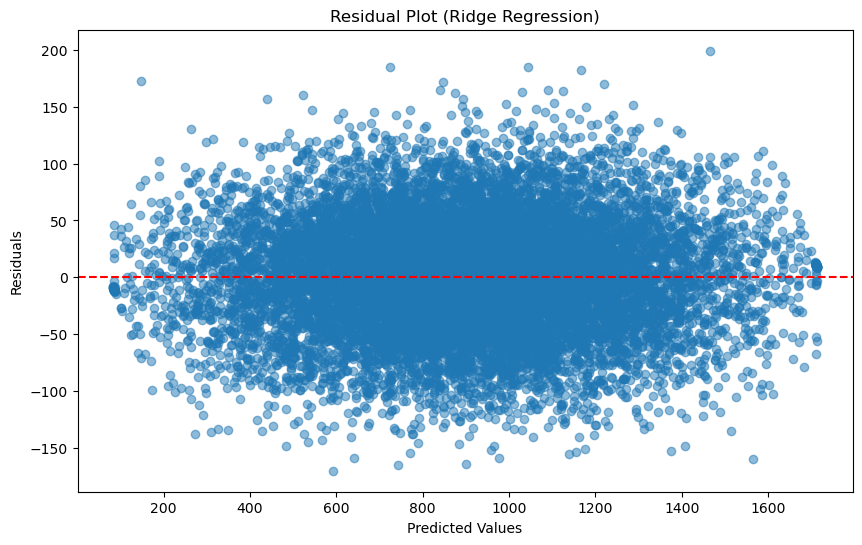

In [109]:
# Residual plot for Ridge Regression
plt.figure(figsize=(10, 6))
residuals_ridge = y_test - y_pred_ridge
plt.scatter(y_pred_ridge, residuals_ridge, alpha=0.5)
plt.axhline(0, color='red', linestyle='--')
plt.title('Residual Plot (Ridge Regression)')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.show()

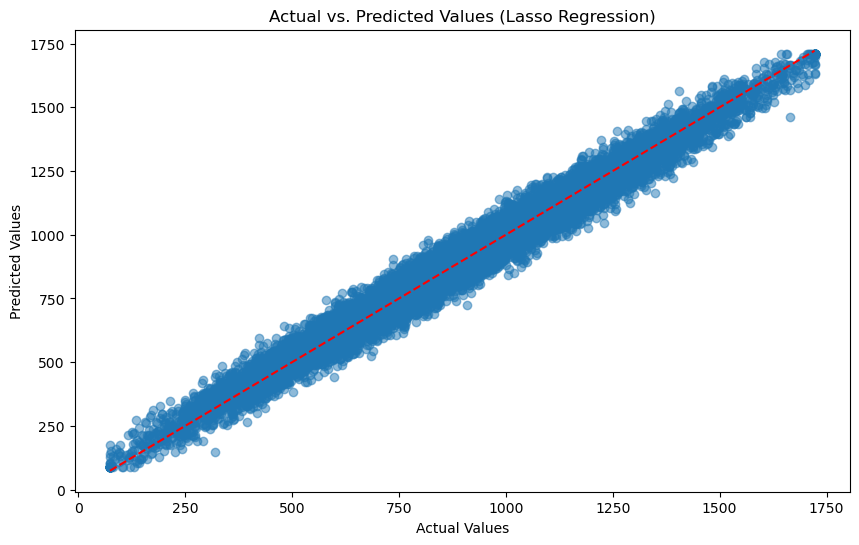

In [110]:
# Scatter plot of Actual vs. Predicted values for Lasso Regression
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_lasso, alpha=0.5)
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--')
plt.title('Actual vs. Predicted Values (Lasso Regression)')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.show()

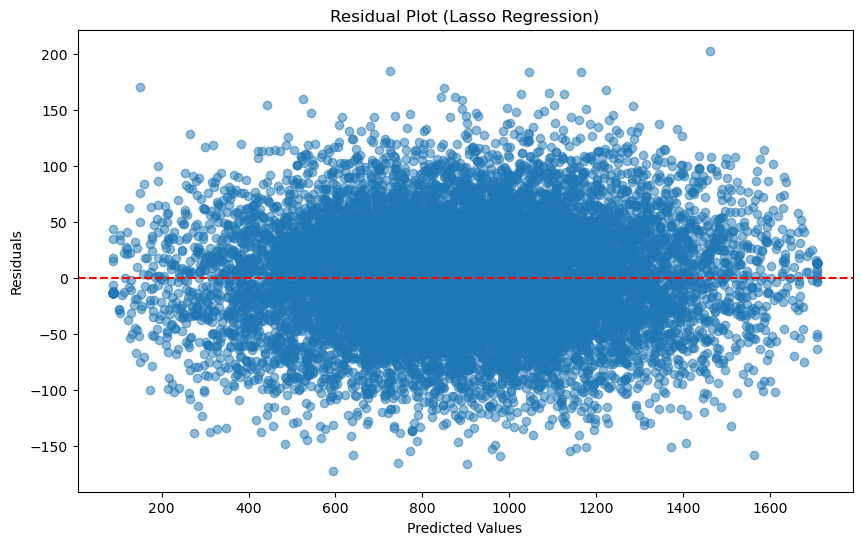

In [111]:
# Residual plot for Lasso Regression
plt.figure(figsize=(10, 6))
residuals_lasso = y_test - y_pred_lasso
plt.scatter(y_pred_lasso, residuals_lasso, alpha=0.5)
plt.axhline(0, color='red', linestyle='--')
plt.title('Residual Plot (Lasso Regression)')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.show()

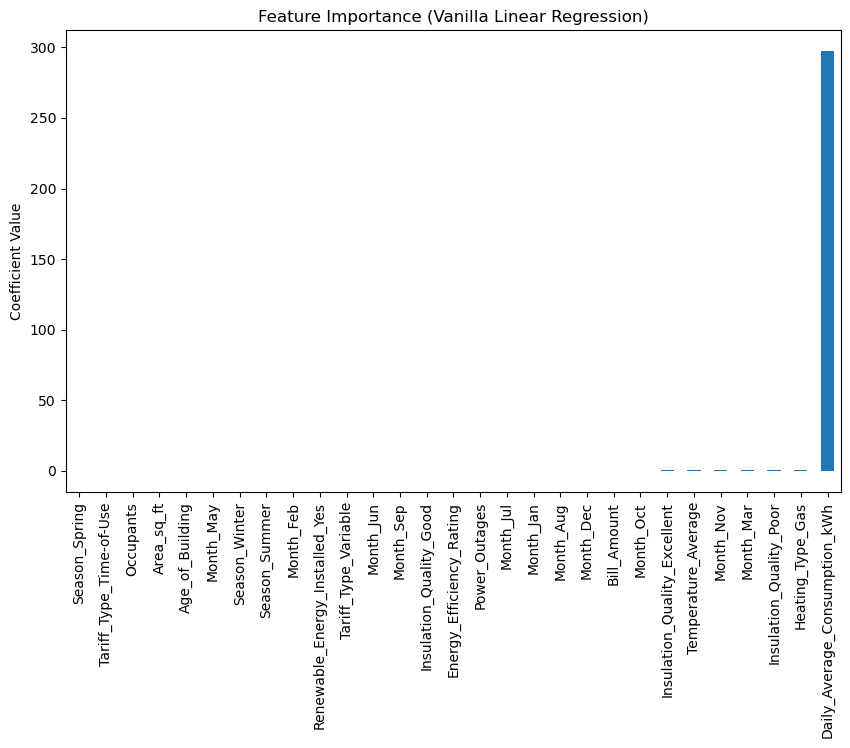

In [112]:
# Coefficient plot for Vanilla Linear Regression
coefficients = pd.Series(vanilla_lr.coef_, index=X_train.columns)
coefficients = coefficients.sort_values()

plt.figure(figsize=(10, 6))
coefficients.plot(kind='bar')
plt.title('Feature Importance (Vanilla Linear Regression)')
plt.ylabel('Coefficient Value')
plt.show()


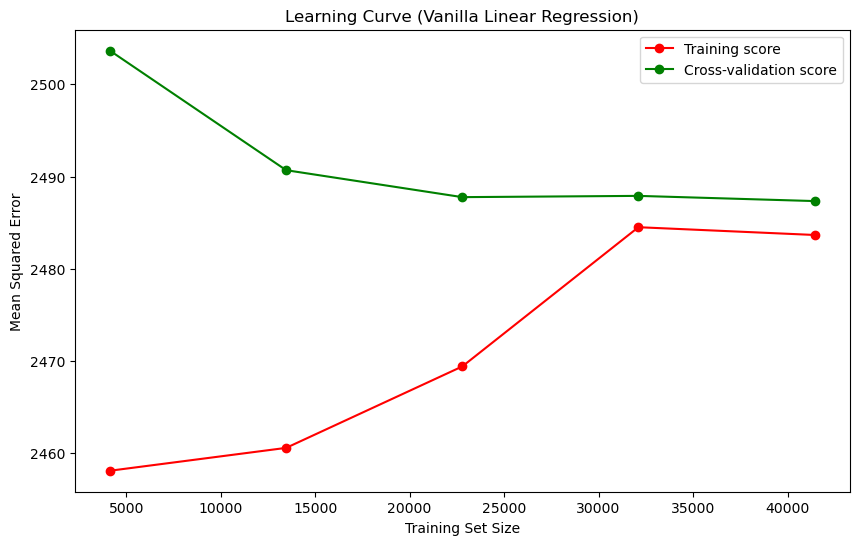

In [113]:
from sklearn.model_selection import learning_curve

# Learning curve for Vanilla Linear Regression
train_sizes, train_scores, test_scores = learning_curve(vanilla_lr, X_train_scaled, y_train, cv=5, scoring='neg_mean_squared_error')

train_scores_mean = -train_scores.mean(axis=1)
test_scores_mean = -test_scores.mean(axis=1)

plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_scores_mean, 'o-', color='r', label='Training score')
plt.plot(train_sizes, test_scores_mean, 'o-', color='g', label='Cross-validation score')
plt.title('Learning Curve (Vanilla Linear Regression)')
plt.xlabel('Training Set Size')
plt.ylabel('Mean Squared Error')
plt.legend(loc='best')
plt.show()


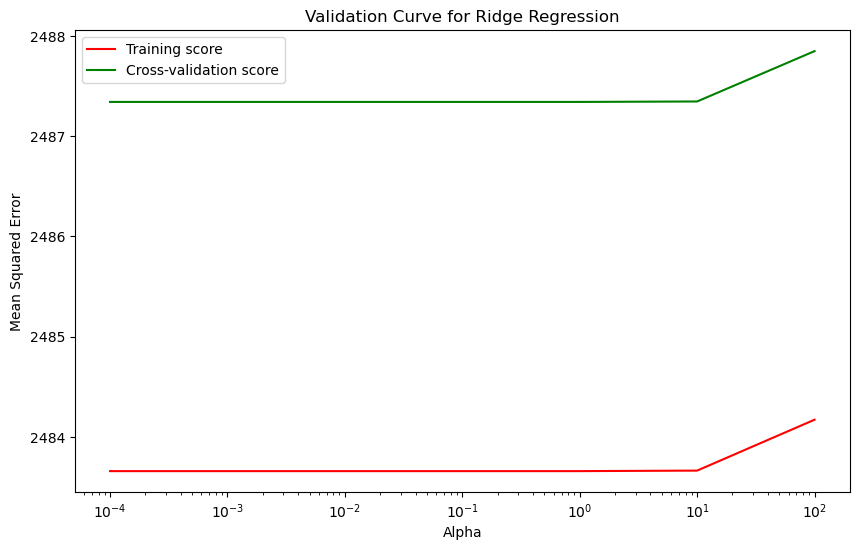

In [114]:
# Validation curve for Ridge Regression
param_range = np.logspace(-4, 2, 7)
train_scores, test_scores = validation_curve(Ridge(), X_train_scaled, y_train, param_name='alpha', param_range=param_range, cv=5, scoring='neg_mean_squared_error')

train_scores_mean = -train_scores.mean(axis=1)
test_scores_mean = -test_scores.mean(axis=1)

plt.figure(figsize=(10, 6))
plt.semilogx(param_range, train_scores_mean, label='Training score', color='r')
plt.semilogx(param_range, test_scores_mean, label='Cross-validation score', color='g')
plt.title('Validation Curve for Ridge Regression')
plt.xlabel('Alpha')
plt.ylabel('Mean Squared Error')
plt.legend(loc='best')
plt.show()


C:\Users\kreti\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


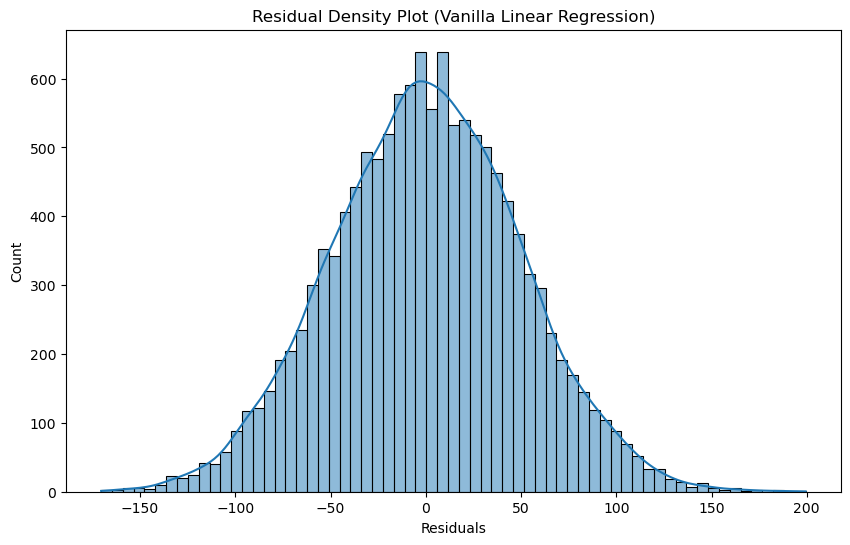

In [115]:
# Residual density plot for Vanilla Linear Regression
residuals_vanilla = y_test - y_pred_vanilla

plt.figure(figsize=(10, 6))
sns.histplot(residuals_vanilla, kde=True)
plt.title('Residual Density Plot (Vanilla Linear Regression)')
plt.xlabel('Residuals')
plt.show()


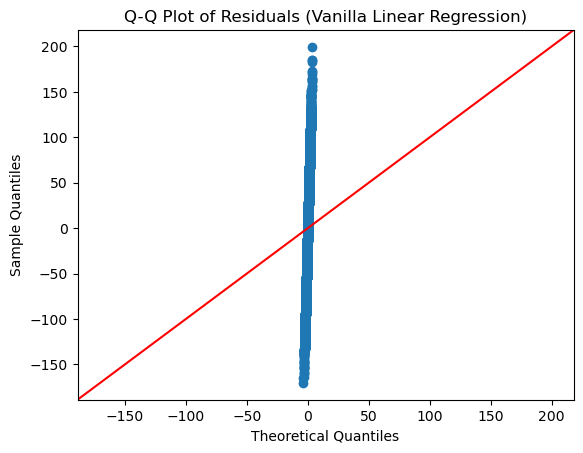

In [116]:
sm.qqplot(residuals_vanilla, line='45')
plt.title('Q-Q Plot of Residuals (Vanilla Linear Regression)')
plt.show()


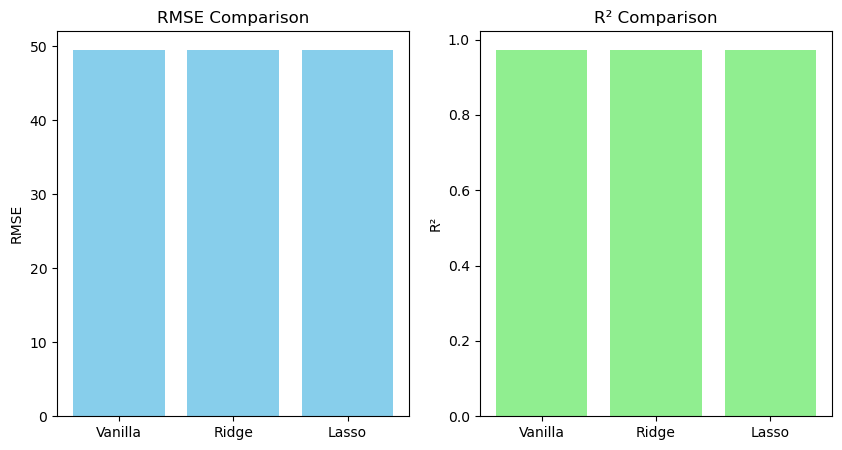

In [117]:
models = ['Vanilla', 'Ridge', 'Lasso']
rmse_scores = [rmse_vanilla, rmse_ridge, rmse_lasso]
r2_scores = [r2_vanilla, r2_ridge, r2_lasso]

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.bar(models, rmse_scores, color='skyblue')
plt.title('RMSE Comparison')
plt.ylabel('RMSE')

plt.subplot(1, 2, 2)
plt.bar(models, r2_scores, color='lightgreen')
plt.title('R² Comparison')
plt.ylabel('R²')

plt.show()


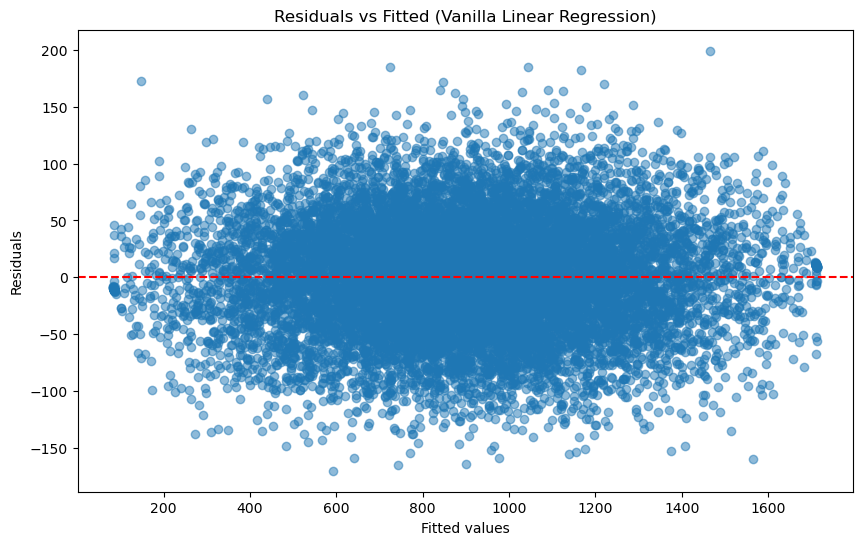

In [118]:
plt.figure(figsize=(10, 6))
plt.scatter(y_pred_vanilla, residuals_vanilla, alpha=0.5)
plt.title('Residuals vs Fitted (Vanilla Linear Regression)')
plt.xlabel('Fitted values')
plt.ylabel('Residuals')
plt.axhline(y=0, color='red', linestyle='--')
plt.show()

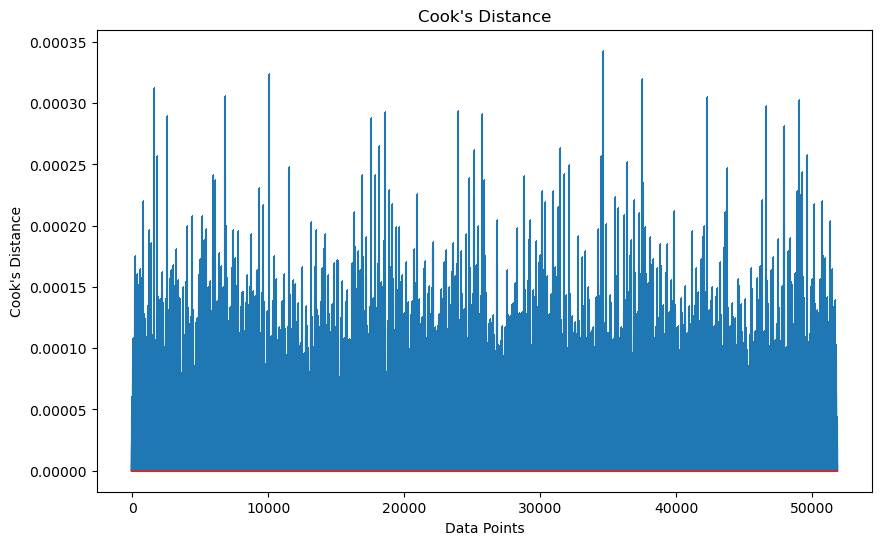

In [119]:
influence = sm.OLS(y_train, sm.add_constant(X_train_scaled)).fit().get_influence()
cooks_d, _ = influence.cooks_distance
plt.figure(figsize=(10, 6))
plt.stem(cooks_d, markerfmt=",")
plt.title("Cook's Distance")
plt.xlabel('Data Points')
plt.ylabel("Cook's Distance")
plt.show()

In [120]:
from sklearn.model_selection import cross_val_score

# Perform k-fold cross-validation
k = 10  # Number of folds
cv_scores = cross_val_score(vanilla_lr, X_train_scaled, y_train, cv=k, scoring='neg_mean_squared_error')

# Calculate the mean and standard deviation of the cross-validation scores
cv_mean = -cv_scores.mean()
cv_std = cv_scores.std()

print(f'Cross-Validation Mean RMSE: {cv_mean:.2f}')
print(f'Cross-Validation RMSE Standard Deviation: {cv_std:.2f}')


Cross-Validation Mean RMSE: 2487.21
Cross-Validation RMSE Standard Deviation: 30.21


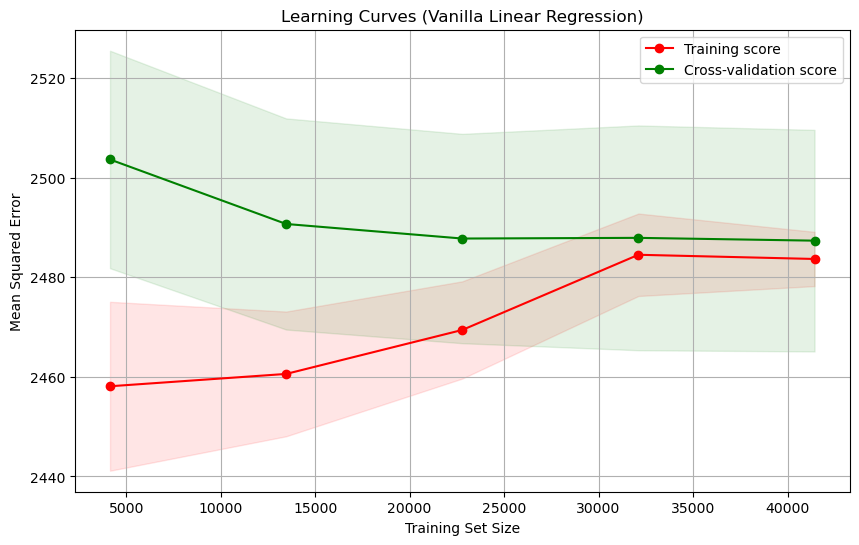

In [121]:
# Generate learning curves
train_sizes, train_scores, test_scores = learning_curve(vanilla_lr, X_train_scaled, y_train, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)

# Calculate mean and standard deviation of training and test scores
train_scores_mean = -train_scores.mean(axis=1)
train_scores_std = train_scores.std(axis=1)
test_scores_mean = -test_scores.mean(axis=1)
test_scores_std = test_scores.std(axis=1)

# Plot learning curves
plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_scores_mean, 'o-', color='r', label='Training score')
plt.plot(train_sizes, test_scores_mean, 'o-', color='g', label='Cross-validation score')
plt.fill_between(train_sizes, train_scores_mean - train_scores_std, train_scores_mean + train_scores_std, alpha=0.1, color='r')
plt.fill_between(train_sizes, test_scores_mean - test_scores_std, test_scores_mean + test_scores_std, alpha=0.1, color='g')
plt.title('Learning Curves (Vanilla Linear Regression)')
plt.xlabel('Training Set Size')
plt.ylabel('Mean Squared Error')
plt.legend(loc='best')
plt.grid()
plt.show()

In [122]:
influential_points = np.where(cooks_d > 4 / len(X_train_scaled))[0]
print(f'Number of influential points: {len(influential_points)}')


X_train_influential_removed = np.delete(X_train_scaled, influential_points, axis=0)
y_train_influential_removed = np.delete(y_train, influential_points, axis=0)

# Refit the model without influential points
vanilla_lr_influential_removed = LinearRegression()
vanilla_lr_influential_removed.fit(X_train_influential_removed, y_train_influential_removed)

# Evaluate the refitted model
y_pred_influential_removed = vanilla_lr_influential_removed.predict(X_test_scaled)
rmse_influential_removed = mean_squared_error(y_test, y_pred_influential_removed, squared=False)
r2_influential_removed = r2_score(y_test, y_pred_influential_removed)

print(f'RMSE after removing influential points: {rmse_influential_removed}')
print(f'R² after removing influential points: {r2_influential_removed}')


Number of influential points: 2389
RMSE after removing influential points: 49.55980906486121
R² after removing influential points: 0.9733242342925239
